● ● ●  Precificação em varejo ● ● ●

Este notebook foi desenvolvido para a análise de um case sobre Precificação em varejo

O case consiste na análise de um conjunto de dados de preços e demanda de produtos de um varejista, e deve responder às seguintes perguntas:

1. Faça a análise exploratória dos dados, apresente em forma de gráficos e estatísticas dos dados. 

2. Em quais categorias de produtos a varejista tem uma posição mais competitiva? Em quais categorias a posição é menos competitiva?

3. Que variáveis impactam o preço de venda dos produtos?

4. Faça uma análise de demanda de produtos. É possível prever qual será a demanda por exemplo, por categoria de produto? E por produto individual?

5. Faça um modelo preditivo para os preços dos produtos. 

6. Como você otimizaria a política de preços praticada pela varejista? Quais seriam as vantagens da política sugerida? Ilustre com exemplos extraídos do próprio data set. 

7. Que outras variáveis não-disponíveis no data set poderiam ser usadas para melhorar as previsões de preço e demanda, assim como a política de otimização de preços?

8. Como você construiria uma pipeline de dados para os modelos das questões 4, 5 e 6?

9. Quais seriam os pontos críticos de monitoramento da pipeline da questão 8, de modo a permitir que falhas e perdas de performance do modelo sejam detectadas o mais rápido possível?

10. Quais as suas impressões gerais sobre o case discutido?

Aqrquivos necessários:
dataset - 'retail_price.csv'
descrição das variáveis - 'features_description.docx'

### Importanto as bibliotecas necessárias

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import sys
from collections import Counter
import itertools
import time
from datetime import date, datetime
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import logging
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
plt.style.use("dark_background")
import warnings
warnings.filterwarnings("ignore")

print('Done!!!')

Done!!!


### abrindo o dataset (.csv)

In [2]:
file = 'retail_price.csv'
mylist = []
for chunk in pd.read_csv(file, sep = ',', encoding='utf-8',
                         converters={'month_year': lambda x: str(x)},
                                     #'month_year': lambda y: str(y)},
                         low_memory=False, chunksize=1000):
    mylist.append(chunk)

df = pd.concat(mylist, axis= 0)
del mylist
print('Done df')

Done df


### fazendo um backup do dataframe para que não tenhamos que ler o arquivo csv novamente

In [3]:
df_red = df.copy()

### eliminando algumas colunas

In [4]:
df_red.drop(['month_year','product_name_lenght','product_description_lenght',
             'product_photos_qty','product_weight_g','s'], axis=1, inplace=True)

### checando os datatypes

In [5]:
df_red.dtypes

product_id                object
product_category_name     object
qty                        int64
total_price              float64
freight_price            float64
unit_price               float64
product_score            float64
customers                  int64
weekday                    int64
weekend                    int64
holiday                    int64
month                      int64
year                       int64
volume                     int64
comp_1                   float64
ps1                      float64
fp1                      float64
comp_2                   float64
ps2                      float64
fp2                      float64
comp_3                   float64
ps3                      float64
fp3                      float64
lag_price                float64
dtype: object

### verificando número de linhas e colunas

In [6]:
df_red.shape

(676, 24)

### visualizando o df

In [7]:
df_red

,product_id,product_category_name,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,1,45.95,15.10,45.95,4.00,57,23,8,1,5,2017,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,3,137.85,12.93,45.95,4.00,61,22,8,1,6,2017,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,6,275.70,14.84,45.95,4.00,123,21,10,1,7,2017,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,4,183.80,14.29,45.95,4.00,90,23,8,1,8,2017,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,2,91.90,15.10,45.95,4.00,54,21,9,1,9,2017,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95
5,bed1,bed_bath_table,3,137.85,15.10,45.95,4.00,50,22,9,2,10,2017,3800,89.90,3.90,21.57,45.95,4.00,15.10,45.95,4.00,15.10,45.95
6,bed1,bed_bath_table,11,445.85,15.83,40.53,4.00,97,22,8,4,11,2017,3800,89.90,3.90,16.29,40.53,4.00,15.83,40.53,4.00,15.83,45.95
7,bed1,bed_bath_table,6,239.94,15.23,39.99,4.00,41,21,10,1,12,2017,3800,88.49,3.90,18.90,39.99,4.00,15.23,39.99,4.00,15.23,40.53
8,bed1,bed_bath_table,19,759.81,16.53,39.99,4.00,62,23,8,2,1,2018,3800,86.90,3.90,19.38,39.99,4.00,16.53,39.99,4.00,16.53,39.99
9,bed1,bed_bath_table,18,719.82,13.75,39.99,4.00,62,20,8,2,2,2018,3800,86.90,3.90,19.21,39.99,4.00,13.75,39.99,4.00,13.75,39.99


### verificando os tipos de produtos presentes no df, assim como as categorias

In [8]:
df_red.product_id.unique()

array(['bed1', 'garden5', 'consoles1', 'garden7', 'health9', 'cool4',
       'health3', 'perfumery1', 'cool5', 'health8', 'garden4',
       'computers5', 'garden10', 'computers6', 'health6', 'garden6',
       'health10', 'watches2', 'health1', 'garden8', 'garden9',
       'watches6', 'cool3', 'perfumery2', 'cool2', 'computers1',
       'consoles2', 'health5', 'watches8', 'furniture4', 'watches5',
       'health7', 'bed3', 'garden3', 'bed2', 'furniture3', 'watches4',
       'watches3', 'furniture2', 'garden2', 'furniture1', 'health2',
       'garden1', 'cool1', 'computers4', 'watches7', 'computers3',
       'health4', 'watches1', 'computers2', 'bed4', 'bed5'], dtype=object)

In [9]:
df_red.product_category_name.unique()

array(['bed_bath_table', 'garden_tools', 'consoles_games',
       'health_beauty', 'cool_stuff', 'perfumery',
       'computers_accessories', 'watches_gifts', 'furniture_decor'],
      dtype=object)

In [10]:
df_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 676 entries, 0 to 675
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   product_id             676 non-null    object 
 1   product_category_name  676 non-null    object 
 2   qty                    676 non-null    int64  
 3   total_price            676 non-null    float64
 4   freight_price          676 non-null    float64
 5   unit_price             676 non-null    float64
 6   product_score          676 non-null    float64
 7   customers              676 non-null    int64  
 8   weekday                676 non-null    int64  
 9   weekend                676 non-null    int64  
 10  holiday                676 non-null    int64  
 11  month                  676 non-null    int64  
 12  year                   676 non-null    int64  
 13  volume                 676 non-null    int64  
 14  comp_1                 676 non-null    float64
 15  ps1   

### análise estatística do df

In [11]:
df_red.describe().T

,count,mean,std,min,25%,50%,75%,max
qty,676.00,14.50,15.44,1.00,4.00,10.00,18.00,122.00
total_price,676.00,1422.71,1700.12,19.90,333.70,807.89,1887.32,12095.00
freight_price,676.00,20.68,10.08,0.00,14.76,17.52,22.71,79.76
unit_price,676.00,106.50,76.18,19.90,53.90,89.90,129.99,364.00
product_score,676.00,4.09,0.23,3.30,3.90,4.10,4.20,4.50
customers,676.00,81.03,62.06,1.00,34.00,62.00,116.00,339.00
weekday,676.00,21.77,0.99,20.00,21.00,22.00,23.00,23.00
weekend,676.00,8.66,0.71,8.00,8.00,9.00,9.00,10.00
holiday,676.00,1.49,0.94,0.00,1.00,1.00,2.00,4.00
month,676.00,6.19,3.24,1.00,3.00,6.00,8.00,12.00


### verificando a presença de valores nulos no df

In [12]:
df_red.isnull().sum().sort_values(ascending=False)

product_id               0
product_category_name    0
fp3                      0
ps3                      0
comp_3                   0
fp2                      0
ps2                      0
comp_2                   0
fp1                      0
ps1                      0
comp_1                   0
volume                   0
year                     0
month                    0
holiday                  0
weekend                  0
weekday                  0
customers                0
product_score            0
unit_price               0
freight_price            0
total_price              0
qty                      0
lag_price                0
dtype: int64

### verificando quantas e quais são as variáveis categóricas e numericas

In [13]:
cat_cols=df_red.select_dtypes(include=['object']).columns
num_cols = df_red.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['product_id', 'product_category_name'], dtype='object')
Numerical Variables:
['qty', 'total_price', 'freight_price', 'unit_price', 'product_score', 'customers', 'weekday', 'weekend', 'holiday', 'month', 'year', 'volume', 'comp_1', 'ps1', 'fp1', 'comp_2', 'ps2', 'fp2', 'comp_3', 'ps3', 'fp3', 'lag_price']


### histograma comparando os preços da varejista com seu concorrentes (todos os produtos)

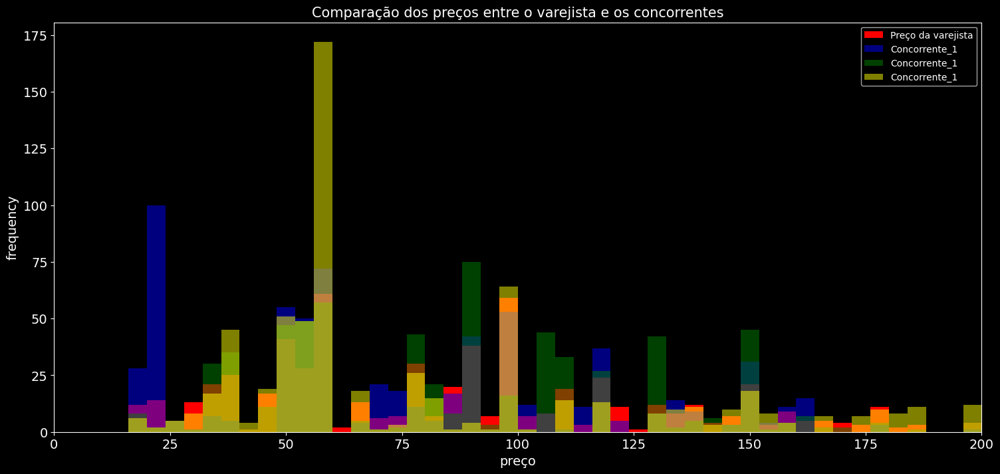

In [14]:
fig, ax = plt.subplots(figsize=(18,8))
ax.hist(df_red['unit_price'], color='red', alpha=1.0, bins=50, range = [0, 200],
       label='Preço da varejista')
ax.hist(df_red['comp_1'], color='blue', alpha=0.5, bins=50, range = [0, 200],
       label='Concorrente_1')
ax.hist(df_red['comp_2'], color='green', alpha=0.5, bins=50, range = [0, 200],
       label='Concorrente_1')
ax.hist(df_red['comp_3'], color='yellow', alpha=0.5, bins=50, range = [0, 200],
       label='Concorrente_1')
plt.xlabel('preço', fontsize=14)
plt.ylabel('frequency', fontsize=14)
plt.title('Comparação dos preços entre o varejista e os concorrentes', fontsize=15)
plt.tick_params(labelsize=14)
ax.set_xlim([0, 200])
plt.legend()
plt.show()

### plotando a distribuição das variáveis numéricas
### como também printando o skew de cada distribuição
### e lado a lado o box plot das variáveis

qty
Skew : 2.67


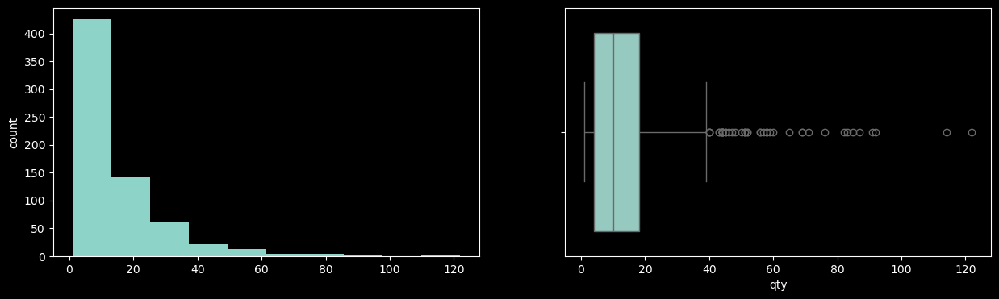

total_price
Skew : 2.61


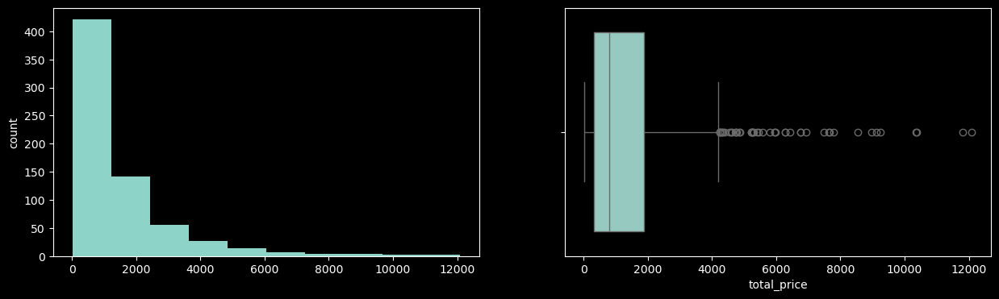

freight_price
Skew : 1.85


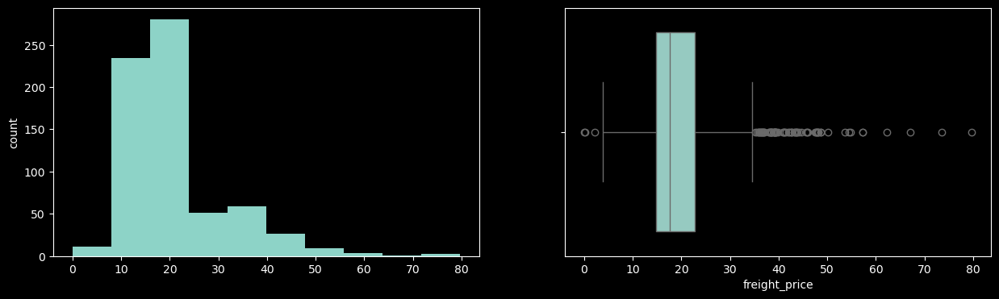

unit_price
Skew : 1.78


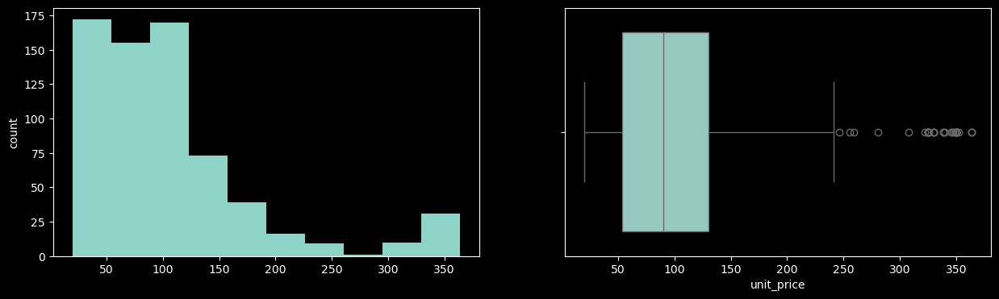

product_score
Skew : -1.03


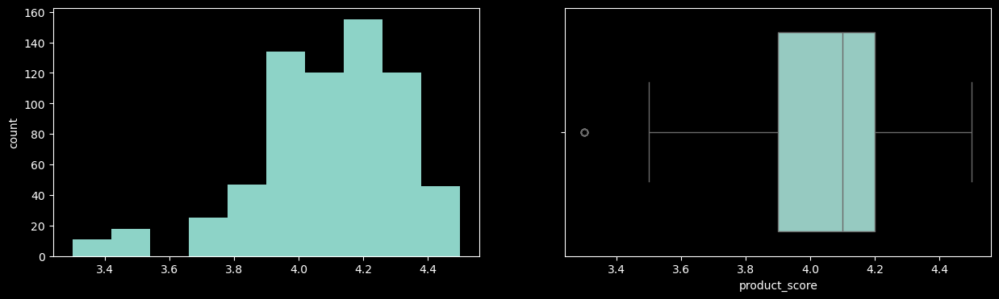

customers
Skew : 1.4


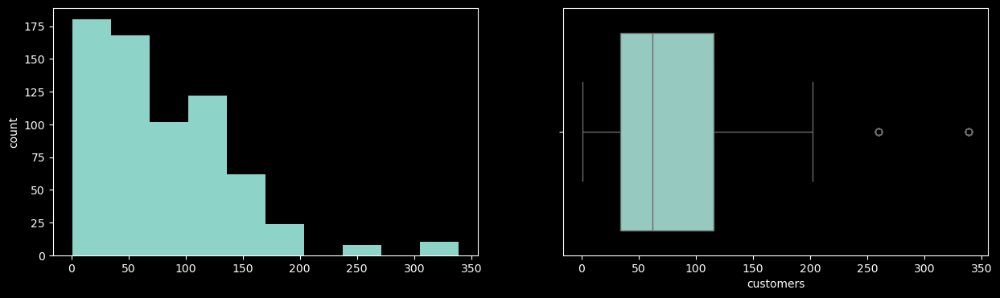

weekday
Skew : -0.21


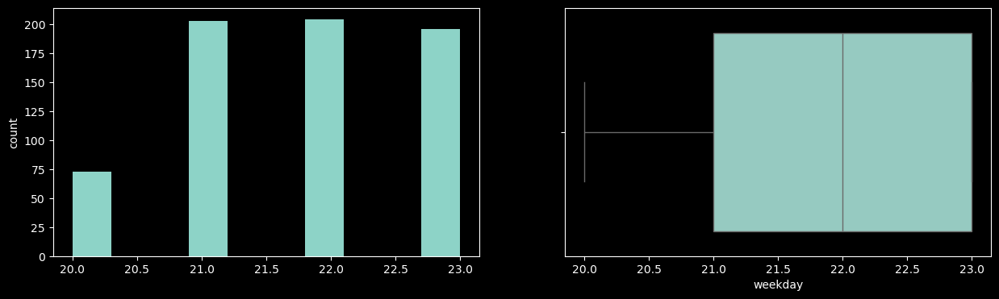

weekend
Skew : 0.59


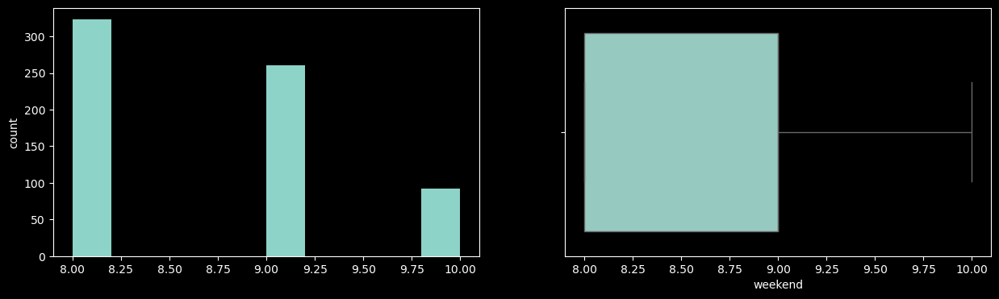

holiday
Skew : 1.19


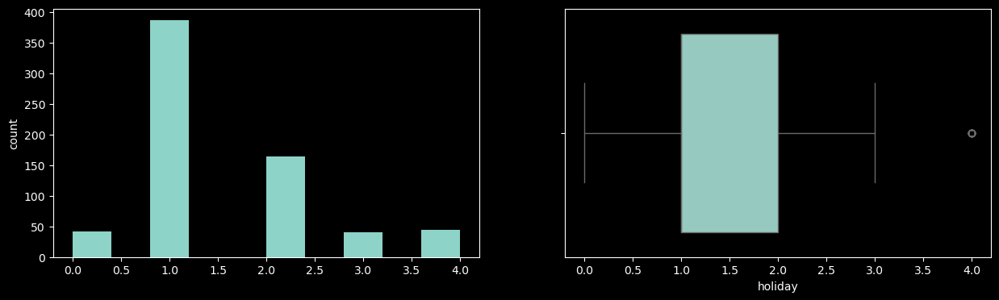

month
Skew : 0.13


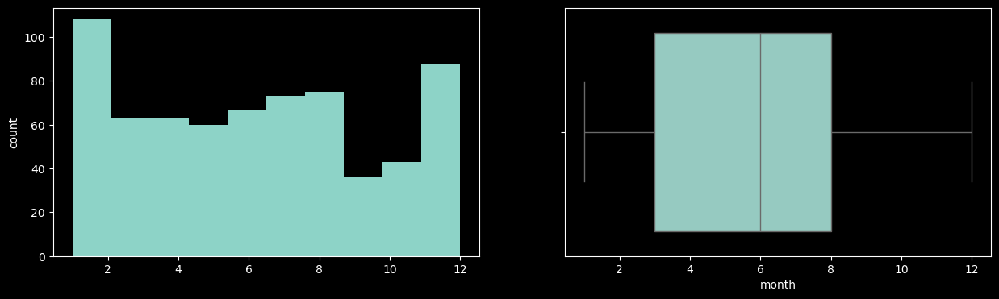

year
Skew : -0.1


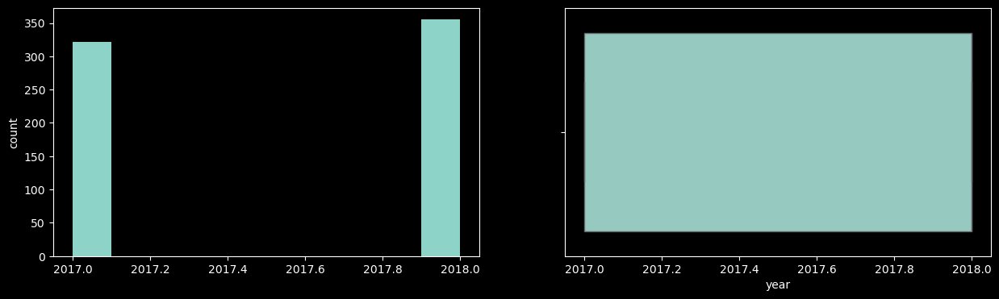

volume
Skew : 1.16


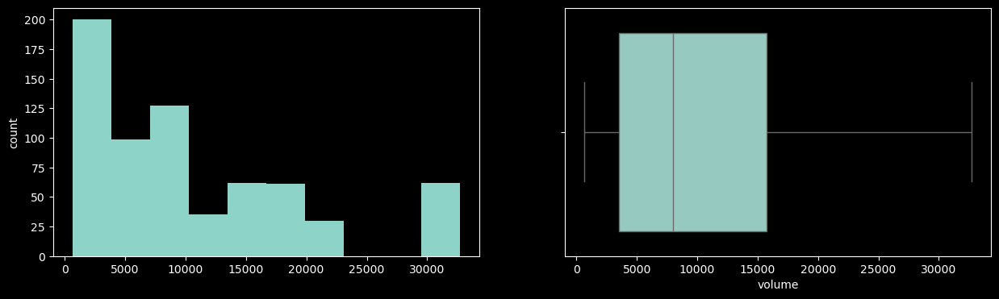

comp_1
Skew : 1.37


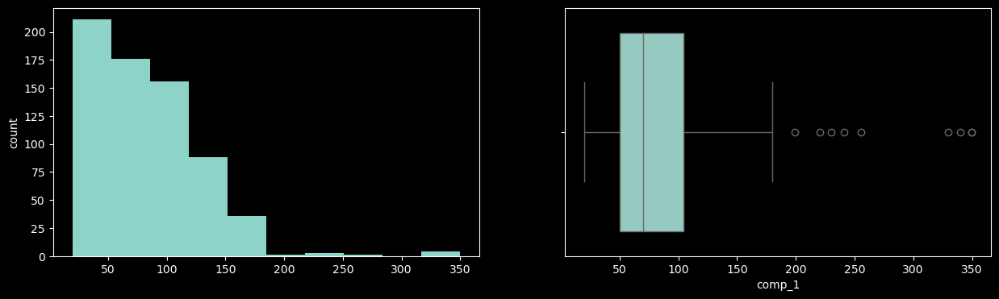

ps1
Skew : -0.88


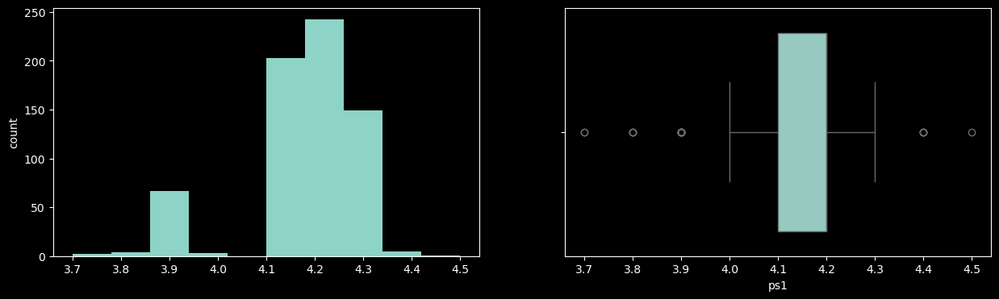

fp1
Skew : 1.64


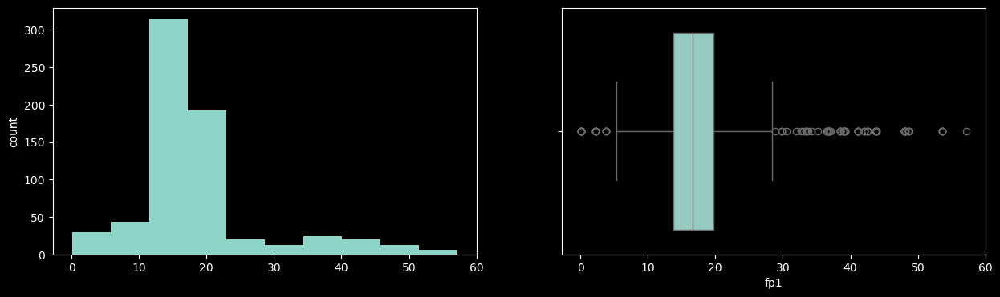

comp_2
Skew : 1.64


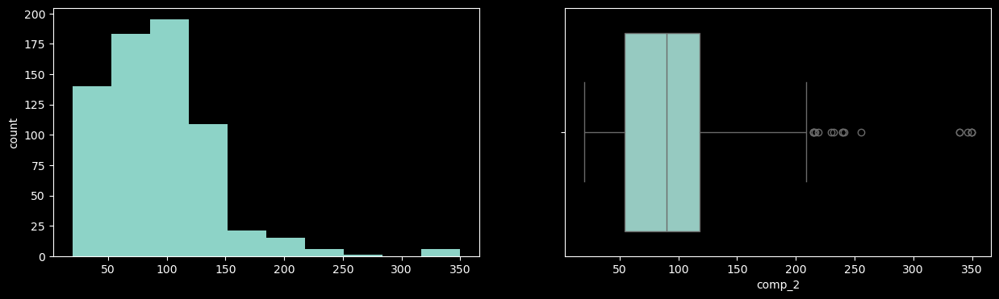

ps2
Skew : -1.66


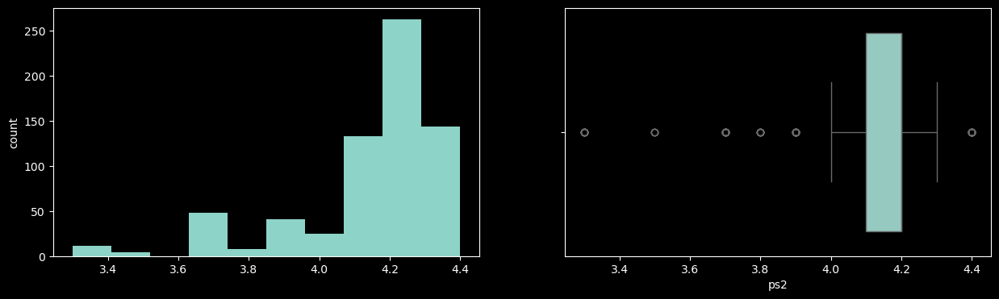

fp2
Skew : 1.69


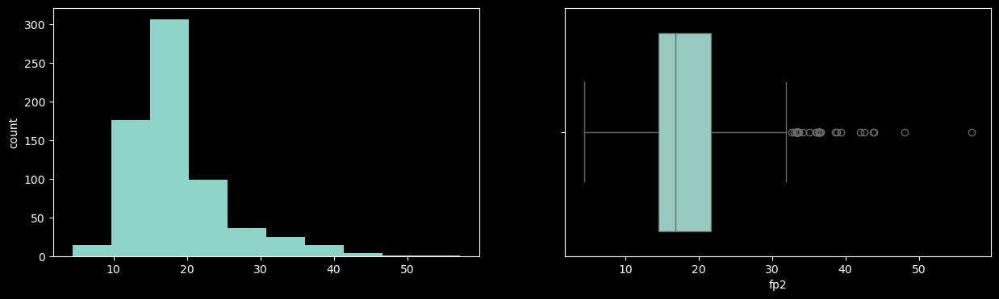

comp_3
Skew : 1.22


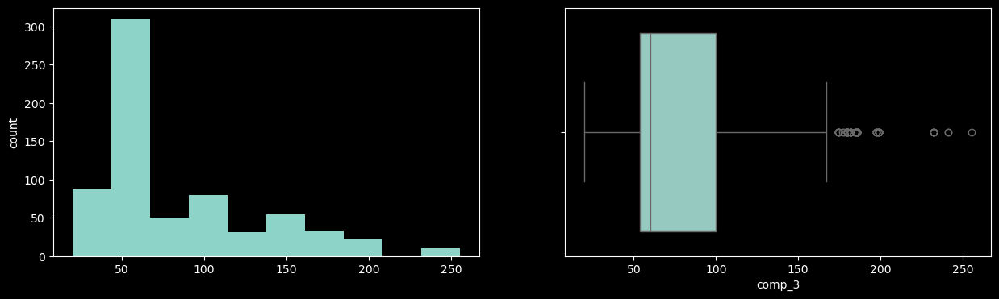

ps3
Skew : -0.16


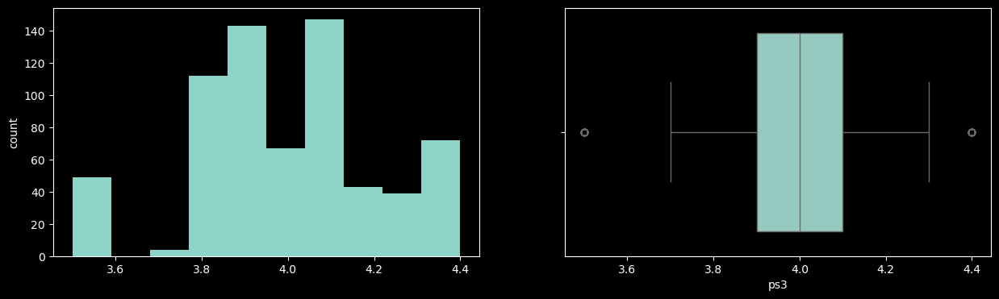

fp3
Skew : 2.19


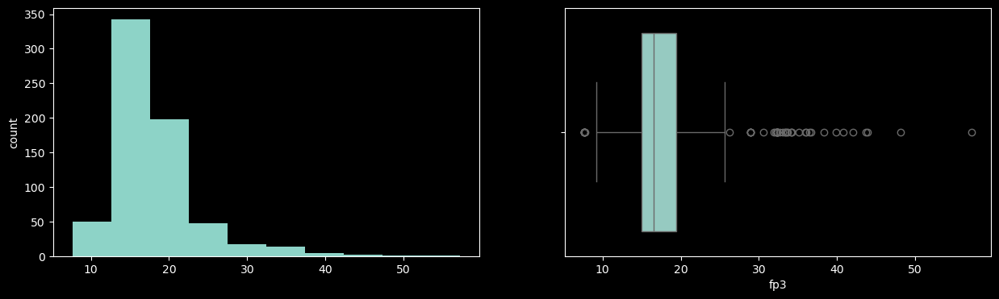

lag_price
Skew : 1.73


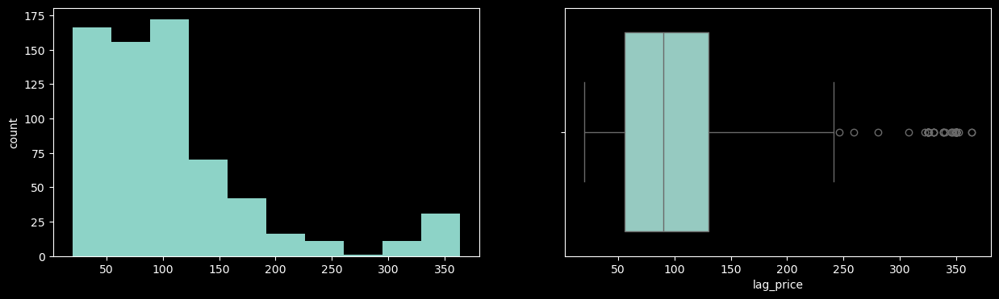

In [15]:
num_cols = df_red.select_dtypes(include=np.number).columns.tolist()
for col in num_cols:
    print(col)
    print('Skew :', round(df_red[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_red[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_red[col])
    plt.show()

### plotando a distribuição das variáveis categóricas

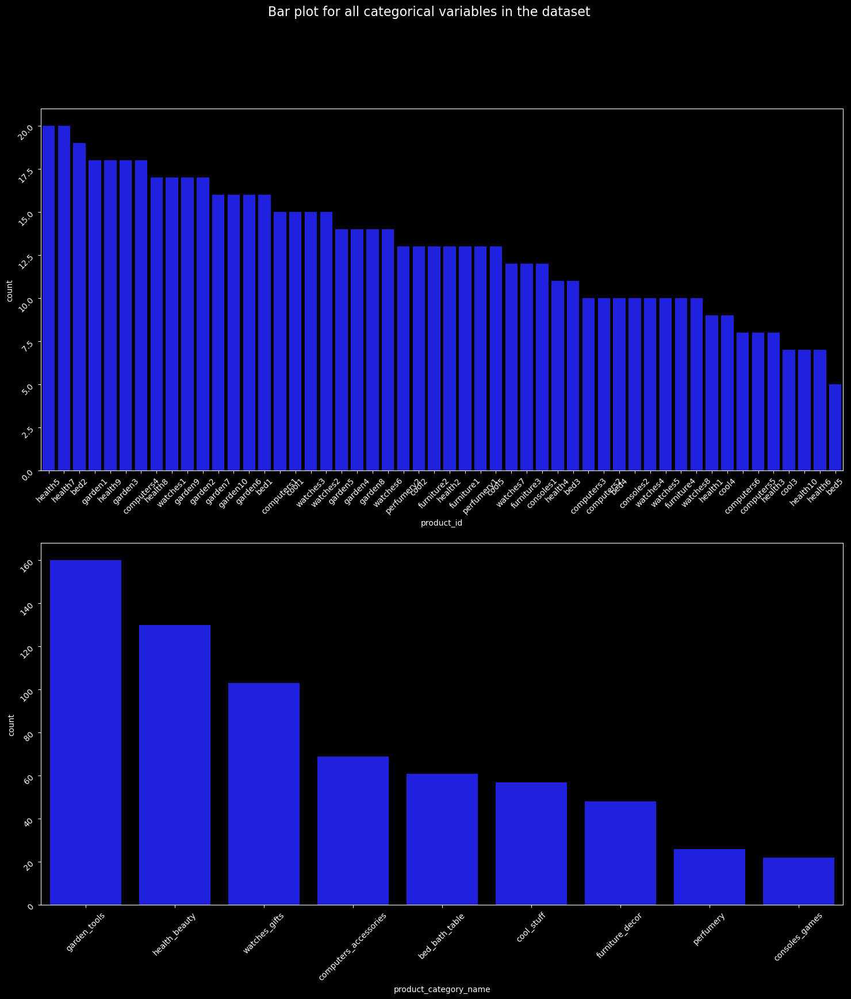

In [16]:
fig, axes = plt.subplots(2, 1, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset', fontsize=16)
sns.countplot(ax = axes[0], x = 'product_id', data = df_red, color = 'blue', 
              order = df_red['product_id'].value_counts().index);
sns.countplot(ax = axes[1], x = 'product_category_name', data = df_red, color = 'blue', 
              order = df_red['product_category_name'].value_counts().index);
axes[0].tick_params(labelrotation=45);
axes[1].tick_params(labelrotation=45);

### criando um df apenas com as variáveis numericas para o estudo de correlação

In [17]:
df_corr = df_red[['qty', 'total_price', 'freight_price', 'unit_price', 'product_score', 'customers', 'weekday', 
               'weekend', 'holiday', 'month', 'year', 'volume', 'comp_1', 'ps1', 'fp1', 'comp_2', 'ps2', 
               'fp2', 'comp_3', 'ps3', 'fp3', 'lag_price']]
df_corr

,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,1,45.95,15.10,45.95,4.00,57,23,8,1,5,2017,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,3,137.85,12.93,45.95,4.00,61,22,8,1,6,2017,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,6,275.70,14.84,45.95,4.00,123,21,10,1,7,2017,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,4,183.80,14.29,45.95,4.00,90,23,8,1,8,2017,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,2,91.90,15.10,45.95,4.00,54,21,9,1,9,2017,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95
5,3,137.85,15.10,45.95,4.00,50,22,9,2,10,2017,3800,89.90,3.90,21.57,45.95,4.00,15.10,45.95,4.00,15.10,45.95
6,11,445.85,15.83,40.53,4.00,97,22,8,4,11,2017,3800,89.90,3.90,16.29,40.53,4.00,15.83,40.53,4.00,15.83,45.95
7,6,239.94,15.23,39.99,4.00,41,21,10,1,12,2017,3800,88.49,3.90,18.90,39.99,4.00,15.23,39.99,4.00,15.23,40.53
8,19,759.81,16.53,39.99,4.00,62,23,8,2,1,2018,3800,86.90,3.90,19.38,39.99,4.00,16.53,39.99,4.00,16.53,39.99
9,18,719.82,13.75,39.99,4.00,62,20,8,2,2,2018,3800,86.90,3.90,19.21,39.99,4.00,13.75,39.99,4.00,13.75,39.99


### calculando a matrix de correlação e plotando um mapa de calor

<Axes: >

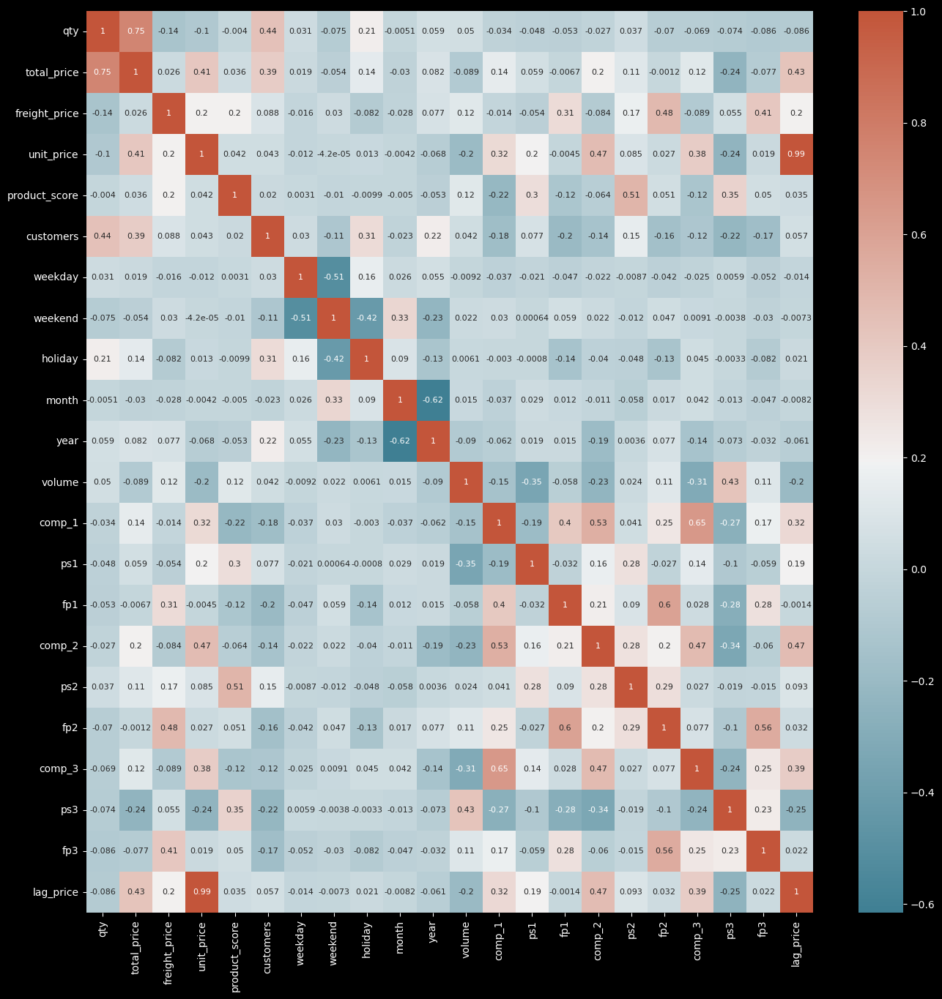

In [18]:
plt.figure(figsize=(16, 16))
corr = df_corr.corr()# plot the heatmap
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns,
            annot=True, annot_kws={"size":8}, cmap=sns.diverging_palette(220, 20, as_cmap=True))

### analisando as distribuições com pairplot

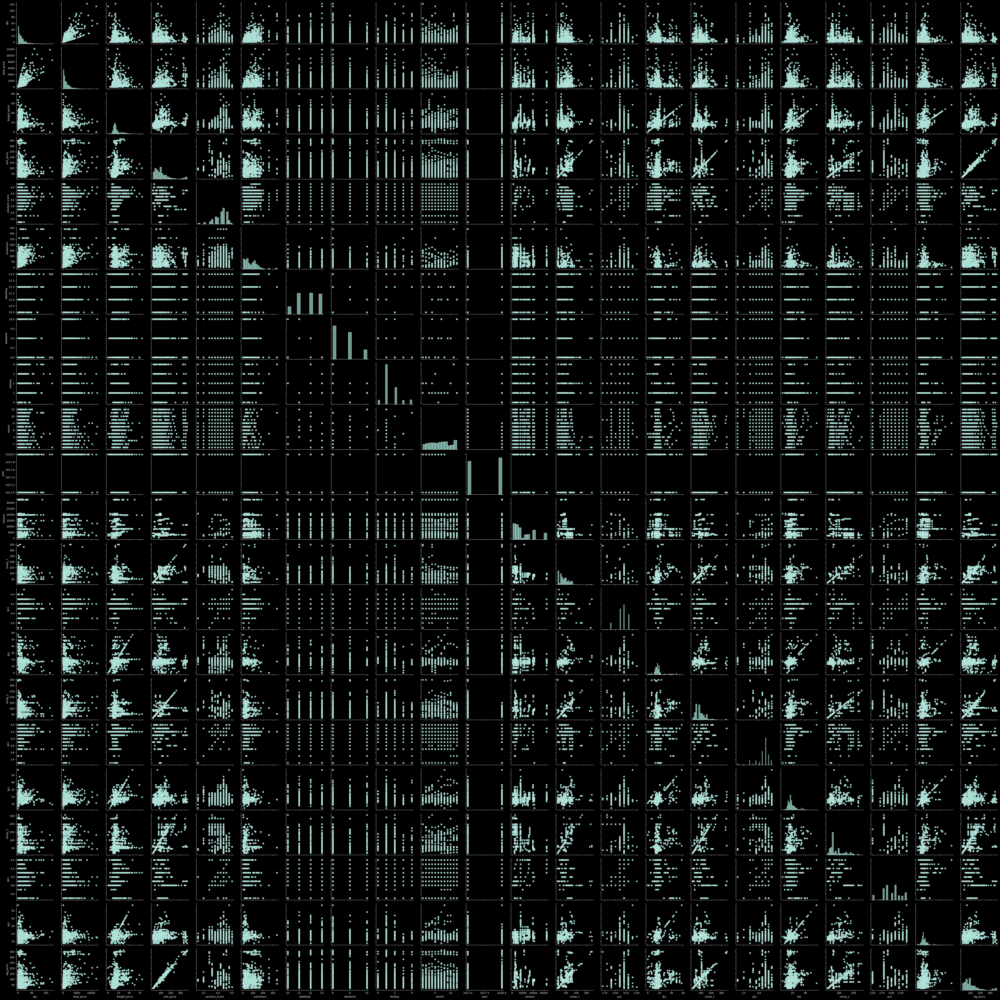

In [19]:
sns.pairplot(df_red)

# Questão 2

In [20]:
df.head()

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,01-05-2017,1,45.95,15.10,45.95,39,161,2,350,4.00,57,23,8,1,5,2017,10.27,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,01-06-2017,3,137.85,12.93,45.95,39,161,2,350,4.00,61,22,8,1,6,2017,6.50,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,01-07-2017,6,275.70,14.84,45.95,39,161,2,350,4.00,123,21,10,1,7,2017,12.07,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,01-08-2017,4,183.80,14.29,45.95,39,161,2,350,4.00,90,23,8,1,8,2017,9.29,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,01-09-2017,2,91.90,15.10,45.95,39,161,2,350,4.00,54,21,9,1,9,2017,5.56,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95


### agrupando o df por categoria e produto

In [21]:
df_cat = df.groupby(['product_category_name','product_id']).agg({'qty':pd.Series.sum,
                                                                 'unit_price':pd.Series.mean,
                                                                 'freight_price':pd.Series.mean,
                                                                 'comp_1':pd.Series.mean,
                                                                 'fp1':pd.Series.mean,
                                                                 'comp_2':pd.Series.mean,
                                                                 'fp2':pd.Series.mean,
                                                                 'comp_3':pd.Series.mean,
                                                                 'fp3':pd.Series.mean,
                                                                 'product_score':pd.Series.mean,
                                                                 'ps1':pd.Series.mean,
                                                                 'ps2':pd.Series.mean,
                                                                 'ps3':pd.Series.mean})
df_cat = df_cat.reset_index()
df_cat['tot_price'] = abs((df_cat['unit_price'] + df_cat['freight_price']).astype('float'))
df_cat['tot_price_1'] = abs((df_cat['comp_1'] + df_cat['fp1']).astype('float'))
df_cat['tot_price_2'] = abs((df_cat['comp_2'] + df_cat['fp2']).astype('float'))
df_cat['tot_price_3'] = abs((df_cat['comp_3'] + df_cat['fp3']).astype('float'))
df_cat.head(10)

,product_category_name,product_id,qty,unit_price,freight_price,comp_1,fp1,comp_2,fp2,comp_3,fp3,product_score,ps1,ps2,ps3,tot_price,tot_price_1,tot_price_2,tot_price_3
0,bed_bath_table,bed1,143,42.21,15.03,86.19,17.66,89.85,16.51,42.21,15.03,4.00,3.90,4.12,4.00,57.24,103.84,106.36,57.24
1,bed_bath_table,bed2,487,86.77,17.06,86.77,17.06,115.32,18.05,49.74,14.85,3.90,3.90,4.03,3.98,103.84,103.84,133.38,64.59
2,bed_bath_table,bed3,111,92.10,15.67,84.50,18.66,92.10,15.67,40.51,15.29,3.30,3.90,3.30,4.00,107.77,103.16,107.77,55.80
3,bed_bath_table,bed4,131,46.73,15.16,85.55,18.80,46.73,15.16,40.64,15.18,4.20,3.90,4.20,4.00,61.88,104.35,61.88,55.82
4,bed_bath_table,bed5,154,198.38,19.20,89.90,15.44,198.38,19.20,45.95,14.45,4.40,3.90,4.40,4.00,217.58,105.34,217.58,60.40
5,computers_accessories,computers1,139,92.48,15.04,137.62,40.38,124.06,20.78,93.73,16.00,4.00,4.19,4.14,3.70,107.52,178.00,144.85,109.73
6,computers_accessories,computers2,183,87.23,16.63,133.60,41.49,141.95,25.35,87.23,16.63,3.50,4.20,4.14,3.50,103.87,175.09,167.29,103.87
7,computers_accessories,computers3,103,143.47,28.08,153.59,39.20,146.90,27.72,129.21,22.01,4.20,4.20,4.22,3.92,171.55,192.79,174.62,151.22
8,computers_accessories,computers4,341,141.58,40.61,141.58,40.61,150.67,33.88,115.82,26.80,4.20,4.20,4.24,3.81,182.19,182.19,184.55,142.62
9,computers_accessories,computers5,127,100.24,14.47,137.72,42.25,148.34,24.67,96.47,17.24,3.50,4.20,4.10,3.50,114.72,179.96,173.01,113.71


### agrupando o df pro categoria e
### criando a variável tot_price = unit_price + freight_price

In [22]:
df_cat2 = df.groupby(['product_category_name']).agg({'qty':pd.Series.sum,
                                                                 'unit_price':pd.Series.mean,
                                                                 'freight_price':pd.Series.mean,
                                                                 'comp_1':pd.Series.mean,
                                                                 'fp1':pd.Series.mean,
                                                                 'comp_2':pd.Series.mean,
                                                                 'fp2':pd.Series.mean,
                                                                 'comp_3':pd.Series.mean,
                                                                 'fp3':pd.Series.mean,
                                                                 'product_score':pd.Series.median,
                                                                 'ps1':pd.Series.median,
                                                                 'ps2':pd.Series.median,
                                                                 'ps3':pd.Series.median})
df_cat2 = df_cat2.reset_index()
df_cat2['tot_price'] = abs((df_cat2['unit_price'] + df_cat2['freight_price']).astype('float'))
df_cat2['tot_price_1'] = abs((df_cat2['comp_1'] + df_cat2['fp1']).astype('float'))
df_cat2['tot_price_2'] = abs((df_cat2['comp_2'] + df_cat2['fp2']).astype('float'))
df_cat2['tot_price_3'] = abs((df_cat2['comp_3'] + df_cat2['fp3']).astype('float'))
df_cat2

,product_category_name,qty,unit_price,freight_price,comp_1,fp1,comp_2,fp2,comp_3,fp3,product_score,ps1,ps2,ps3,tot_price,tot_price_1,tot_price_2,tot_price_3
0,bed_bath_table,1026,78.63,16.14,86.27,17.66,100.02,16.84,44.30,15.00,4.00,3.90,4.00,4.00,94.77,103.93,116.85,59.30
1,computers_accessories,1167,119.48,25.10,139.46,40.80,142.72,26.99,102.60,19.89,4.20,4.20,4.30,3.50,144.59,180.26,169.71,122.49
2,consoles_games,239,27.03,14.81,27.10,15.18,26.97,14.44,27.03,14.81,4.20,4.20,3.90,4.20,41.84,42.28,41.40,41.84
3,cool_stuff,558,107.86,18.98,96.48,17.45,120.83,19.94,86.52,17.89,4.30,4.20,4.30,4.30,126.83,113.93,140.78,104.41
4,furniture_decor,894,60.15,16.94,75.88,16.54,38.73,14.72,86.70,21.25,3.80,4.10,3.70,4.40,77.10,92.42,53.44,107.95
5,garden_tools,2398,80.09,28.46,58.06,18.36,58.19,21.01,59.88,20.18,4.20,4.10,4.20,4.10,108.55,76.42,79.20,80.07
6,health_beauty,1842,132.31,18.61,32.97,14.25,90.59,15.24,59.73,15.45,4.20,4.30,4.10,3.90,150.92,47.22,105.82,75.18
7,perfumery,244,89.35,14.34,59.69,13.59,119.01,15.08,89.35,14.34,4.35,4.30,4.40,4.35,103.69,73.28,134.09,103.69
8,watches_gifts,1431,164.88,16.49,135.53,13.72,129.62,17.50,172.51,18.27,4.00,4.20,4.20,3.80,181.37,149.25,147.12,190.78


### comparação dos scores entre a varejista e concorrentes

<Axes: xlabel='product_category_name'>

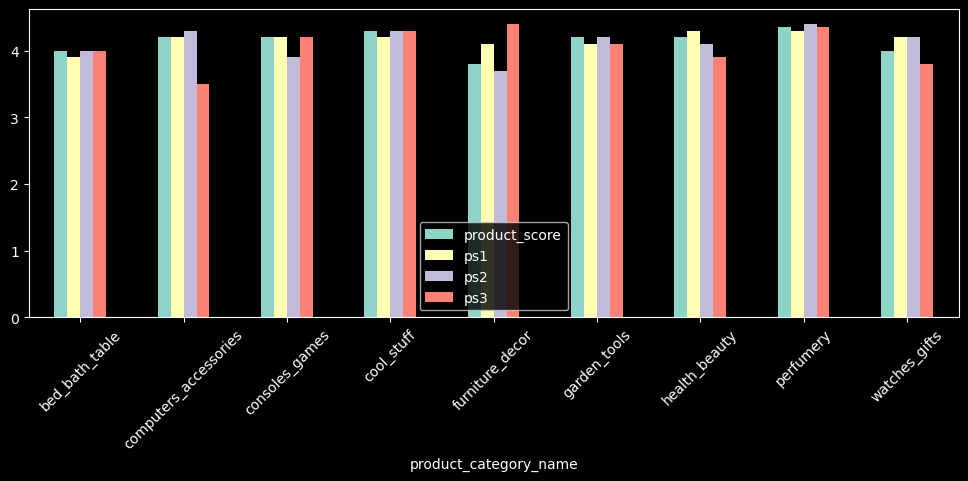

In [23]:
df_cat2_multi2 = df_cat2[['product_category_name','product_score','ps1','ps2','ps3']]
df_cat2_multi2.set_index(['product_category_name']).plot.bar(figsize=(12,4),rot=45)

### comparação dos preços totais entre a varejista e concorrentes

<Axes: xlabel='product_category_name'>

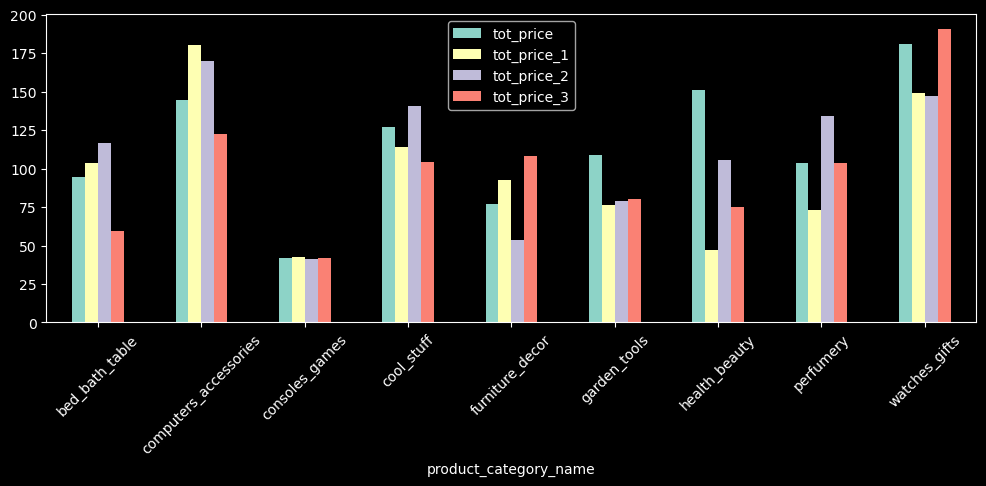

In [24]:
df_cat2_multi = df_cat2[['product_category_name','tot_price','tot_price_1','tot_price_2','tot_price_3']]
df_cat2_multi.set_index(['product_category_name']).plot.bar(figsize=(12,4),rot=45)

# Questão 3

### calculate correlation matrix

<Axes: >

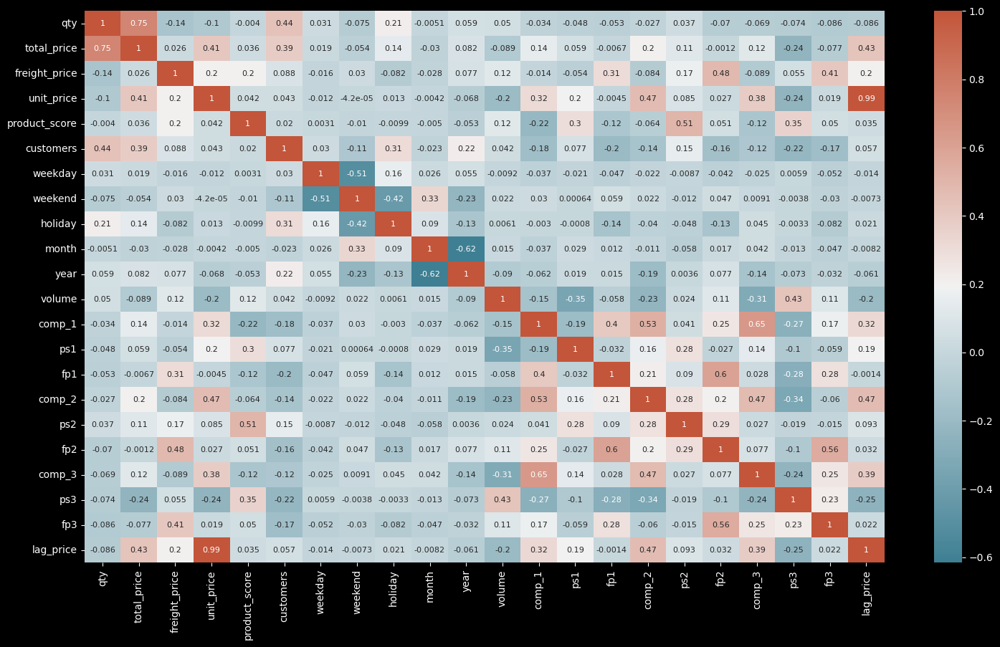

In [25]:
plt.figure(figsize=(18, 10))
corr = df_corr.corr()# plot the heatmap
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
            annot=True, annot_kws={"size":8}, cmap=sns.diverging_palette(220, 20, as_cmap=True))

### importando dataframe_image para poder exportar variáveis do df para um arquivo de imagem
### salvando a matriz de correlação como imagem

In [26]:
import dataframe_image as dfi
dfi.export(df_corr.corr(),"mytable.png")

# Questão 4
## demanda por por categoria de produto

In [27]:
df.head()

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,01-05-2017,1,45.95,15.10,45.95,39,161,2,350,4.00,57,23,8,1,5,2017,10.27,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,01-06-2017,3,137.85,12.93,45.95,39,161,2,350,4.00,61,22,8,1,6,2017,6.50,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,01-07-2017,6,275.70,14.84,45.95,39,161,2,350,4.00,123,21,10,1,7,2017,12.07,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,01-08-2017,4,183.80,14.29,45.95,39,161,2,350,4.00,90,23,8,1,8,2017,9.29,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,01-09-2017,2,91.90,15.10,45.95,39,161,2,350,4.00,54,21,9,1,9,2017,5.56,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95


### agrupando o df por categoria, ano e mês

In [28]:
df_dem = df.groupby(['product_category_name','year','month']).agg({'customers':pd.Series.sum})
df_dem = df_dem.reset_index()
df_dem['data'] = pd.to_datetime(df_dem.year.astype(str) + '/' + df_dem.month.astype(str))
df_dem

,product_category_name,year,month,customers,data
0,bed_bath_table,2017,2,2,2017-02-01
1,bed_bath_table,2017,3,20,2017-03-01
2,bed_bath_table,2017,4,31,2017-04-01
3,bed_bath_table,2017,5,171,2017-05-01
4,bed_bath_table,2017,6,183,2017-06-01
5,bed_bath_table,2017,7,369,2017-07-01
6,bed_bath_table,2017,8,270,2017-08-01
7,bed_bath_table,2017,9,162,2017-09-01
8,bed_bath_table,2017,10,200,2017-10-01
9,bed_bath_table,2017,11,388,2017-11-01


### criando dataframes individuais para cada categoria e plotando a demanda vs mes/ano

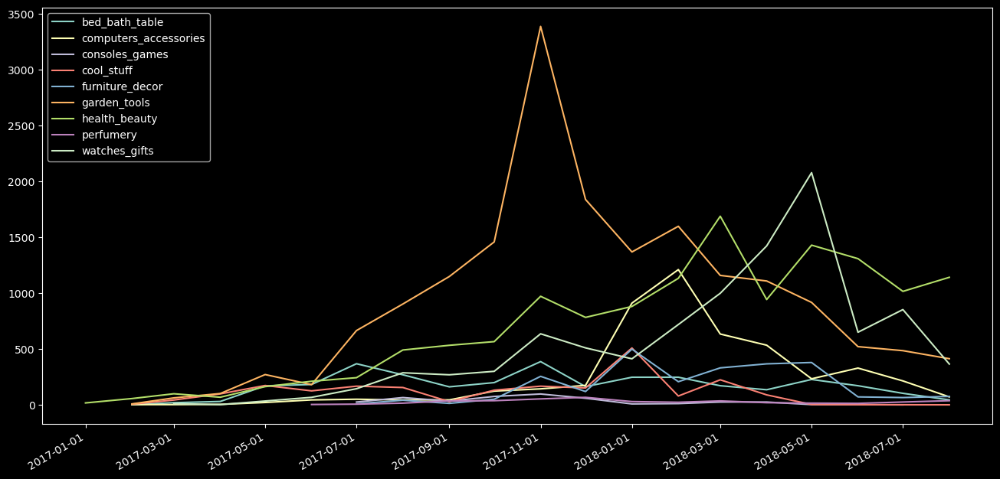

In [29]:
import matplotlib.dates as mdates

df_bed = df_dem[df_dem['product_category_name']=='bed_bath_table']
df_com = df_dem[df_dem['product_category_name']=='computers_accessories']
df_con = df_dem[df_dem['product_category_name']=='consoles_games']
df_coo = df_dem[df_dem['product_category_name']=='cool_stuff']
df_fur = df_dem[df_dem['product_category_name']=='furniture_decor']
df_gar = df_dem[df_dem['product_category_name']=='garden_tools']
df_hea = df_dem[df_dem['product_category_name']=='health_beauty']
df_per = df_dem[df_dem['product_category_name']=='perfumery']
df_wat = df_dem[df_dem['product_category_name']=='watches_gifts']

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_bed['data'], df_bed['customers'], label='bed_bath_table')
ax.plot(df_com['data'], df_com['customers'], label='computers_accessories')

ax.plot(df_con['data'], df_con['customers'], label='consoles_games')
ax.plot(df_coo['data'], df_coo['customers'], label='cool_stuff')
ax.plot(df_fur['data'], df_fur['customers'], label='furniture_decor')
ax.plot(df_gar['data'], df_gar['customers'], label='garden_tools')
ax.plot(df_hea['data'], df_hea['customers'], label='health_beauty')
ax.plot(df_per['data'], df_per['customers'], label='perfumery')
ax.plot(df_wat['data'], df_wat['customers'], label='watches_gifts')

# Format x-axis labels as dates
date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.legend(loc='upper left')
plt.show()

In [30]:
df_hea_back = df_hea.copy()

### criando um df com dados da demanda para uma categoria

In [31]:
df_bed.drop(['product_category_name','year','month'], axis=1, inplace=True)
df_bed.set_index('data', inplace=True)
df_bed

,customers
data,
2017-02-01,2
2017-03-01,20
2017-04-01,31
2017-05-01,171
2017-06-01,183
2017-07-01,369
2017-08-01,270
2017-09-01,162
2017-10-01,200


### transformando customers em float

In [32]:
df_bedA = df_bed.copy()
df_bedA['customers'] = df_bedA['customers'].astype(float)
print(df_bedA.shape)
df_bedA.head()

(19, 1)


,customers
data,
2017-02-01,2.00
2017-03-01,20.00
2017-04-01,31.00
2017-05-01,171.00
2017-06-01,183.00


### testando o modelo ARIMA fazendo o fit em um dataset de treino
### e depois validando no dataset de teste

C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:              customers   No. Observations:                   19
Model:                 ARIMA(0, 1, 1)   Log Likelihood                -108.141
Date:                Mon, 13 May 2024   AIC                            220.282
Time:                        13:09:53   BIC                            222.062
Sample:                    02-01-2017   HQIC                           220.527
                         - 08-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3797      0.230     -1.654      0.098      -0.830       0.070
sigma2      9597.4500   3453.883      2.779      0.005    2827.963    1.64e+04
Ljung-Box (L1) (Q):                   0.00   Jarque-

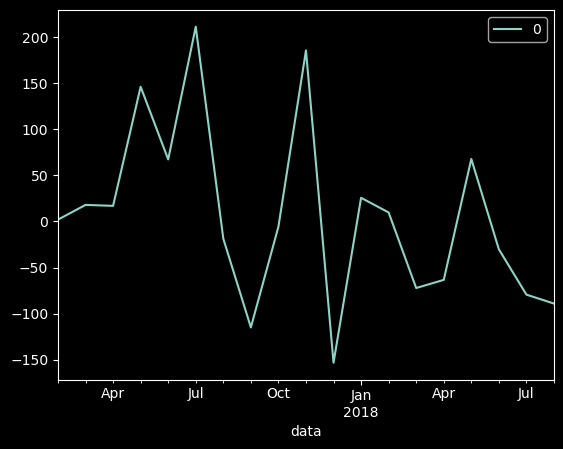

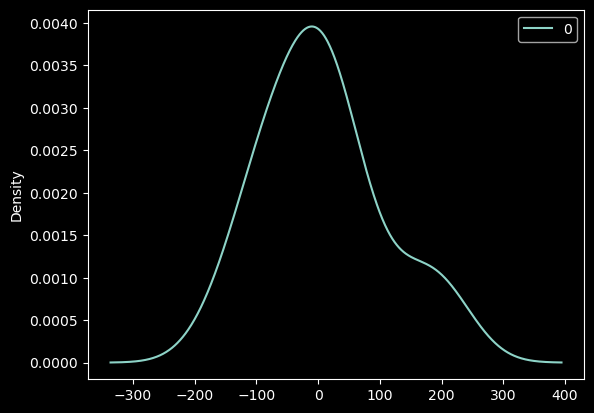

            0
count   19.00
mean     6.53
std     97.76
min   -153.44
25%    -67.87
50%      2.00
75%     46.58
max    211.59


In [33]:
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(df_bedA, order=(0, 1, 1))
results_ARIMA = model.fit()
# summary of fit model
print(results_ARIMA.summary())
# line plot of residuals
residuals = DataFrame(results_ARIMA.resid)
residuals.plot()
plt.show()
# density plot of residuals
residuals.plot(kind='kde')
plt.show()
# summary stats of residuals
print(residuals.describe())

In [34]:
print(df_bedA.shape)

(19, 1)


### evaluate an ARIMA model using a walk-forward validation

Size =  14
predicted=201.697120, expected=136.000000
predicted=160.797933, expected=228.000000
predicted=200.974891, expected=172.000000
predicted=184.357732, expected=104.000000
predicted=137.750459, expected=45.000000
Test RMSE: 70.330


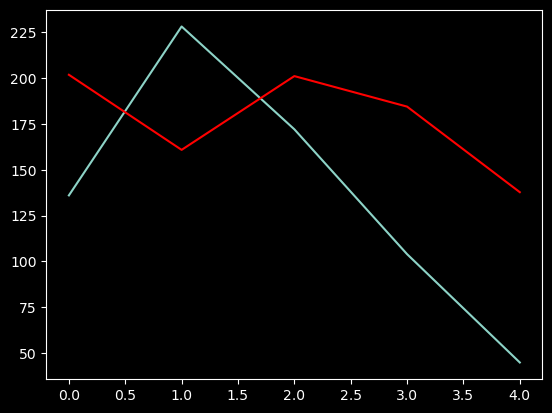

In [35]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# split into train and test sets
X = df_bedA.customers.values
size = int(len(X) * 0.75)
print('Size = ',size)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
  model = ARIMA(history, order=(0,1,1))
  model_fit = model.fit()
  output = model_fit.forecast()
  yhat = output[0]
  predictions.append(yhat)
  obs = test[t]
  history.append(obs)
  print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

### Aplicando a metodologia de média móvel para modular a distribuição (bed_bath_table)
### Média Móvel Simples (SMA),
### Média Móvel Cumulativa (CMA)
### Média Móvel Exponencial (EMA)

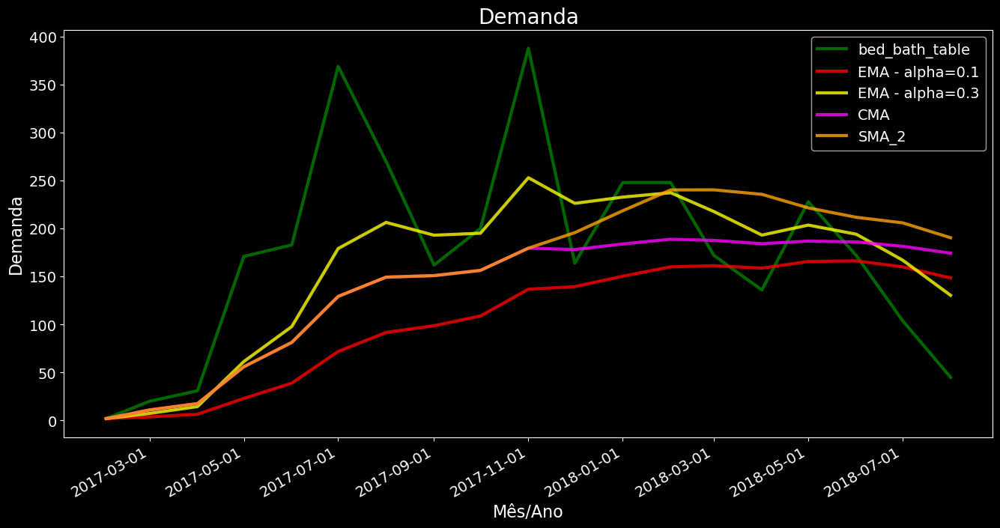

In [36]:
# Let's smoothing factor - 0.1
df_bed['EMA_0.1'] = df_bed.customers.ewm(alpha=0.1, adjust=False).mean()
# Let's smoothing factor  - 0.3
df_bed['EMA_0.3'] = df_bed.customers.ewm(alpha=0.3, adjust=False).mean()
# CMA
df_bed['CMA'] = df_bed.customers.expanding().mean()
# SMA over a period of 2 years 
df_bed['SMA_2'] = df_bed.customers.rolling(10, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_bed['customers'], color='green', linewidth=3, alpha=0.8)
ax.plot(df_bed['EMA_0.1'], color='red', linewidth=3, alpha=0.8)
ax.plot(df_bed['EMA_0.3'], color='yellow', linewidth=3, alpha=0.8)
ax.plot(df_bed['CMA'], color='magenta', linewidth=3, alpha=0.8)
ax.plot(df_bed['SMA_2'], color='orange', linewidth=3, alpha=0.8)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(labels=['bed_bath_table', 'EMA - alpha=0.1', 'EMA - alpha=0.3', 'CMA', 'SMA_2'], fontsize=14)
plt.title('Demanda', fontsize=20)
plt.xlabel('Mês/Ano', fontsize=16)
plt.ylabel('Demanda', fontsize=16)

date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.show()

### repetindo a análise para a categoria "perfumery"

In [37]:
df_per.drop(['product_category_name','year','month'], axis=1, inplace=True)
df_per.set_index('data', inplace=True)
df_per

,customers
data,
2017-06-01,4
2017-07-01,7
2017-08-01,16
2017-09-01,36
2017-10-01,38
2017-11-01,54
2017-12-01,68
2018-01-01,30
2018-02-01,24


### Aplicando a metodologia de média móvel para modular a distribuição (perfumery)
### Média Móvel Simples (SMA),
### Média Móvel Cumulativa (CMA)
### Média Móvel Exponencial (EMA)

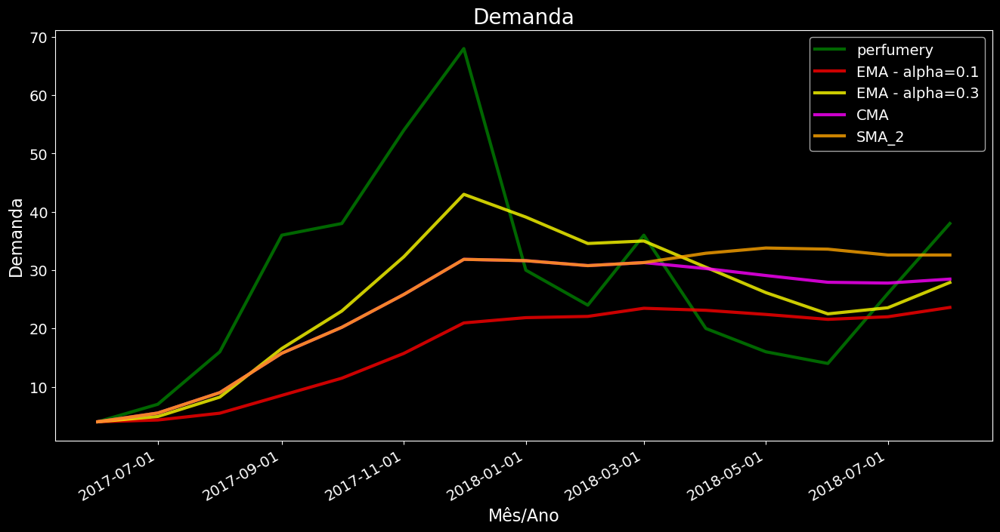

In [38]:
# Let's smoothing factor - 0.1
df_per['EMA_0.1'] = df_per.customers.ewm(alpha=0.1, adjust=False).mean()
# Let's smoothing factor  - 0.3
df_per['EMA_0.3'] = df_per.customers.ewm(alpha=0.3, adjust=False).mean()
# CMA
df_per['CMA'] = df_per.customers.expanding().mean()
# SMA over a period of 2 years 
df_per['SMA_2'] = df_per.customers.rolling(10, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_per['customers'], color='green', linewidth=3, alpha=0.8)
ax.plot(df_per['EMA_0.1'], color='red', linewidth=3, alpha=0.8)
ax.plot(df_per['EMA_0.3'], color='yellow', linewidth=3, alpha=0.8)
ax.plot(df_per['CMA'], color='magenta', linewidth=3, alpha=0.8)
ax.plot(df_per['SMA_2'], color='orange', linewidth=3, alpha=0.8)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(labels=['perfumery', 'EMA - alpha=0.1', 'EMA - alpha=0.3', 'CMA', 'SMA_2'], fontsize=14)
plt.title('Demanda', fontsize=20)
plt.xlabel('Mês/Ano', fontsize=16)
plt.ylabel('Demanda', fontsize=16)

date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.show()

### repetindo a análise para a categoria "computers_accessories"

In [39]:
df_com.drop(['product_category_name','year','month'], axis=1, inplace=True)
df_com.set_index('data', inplace=True)
df_com

,customers
data,
2017-02-01,3
2017-03-01,3
2017-04-01,5
2017-05-01,22
2017-06-01,45
2017-07-01,51
2017-08-01,45
2017-09-01,45
2017-10-01,124


### Aplicando a metodologia de média móvel para modular a distribuição (computers_accessories)
### Média Móvel Simples (SMA),
### Média Móvel Cumulativa (CMA)
### Média Móvel Exponencial (EMA)

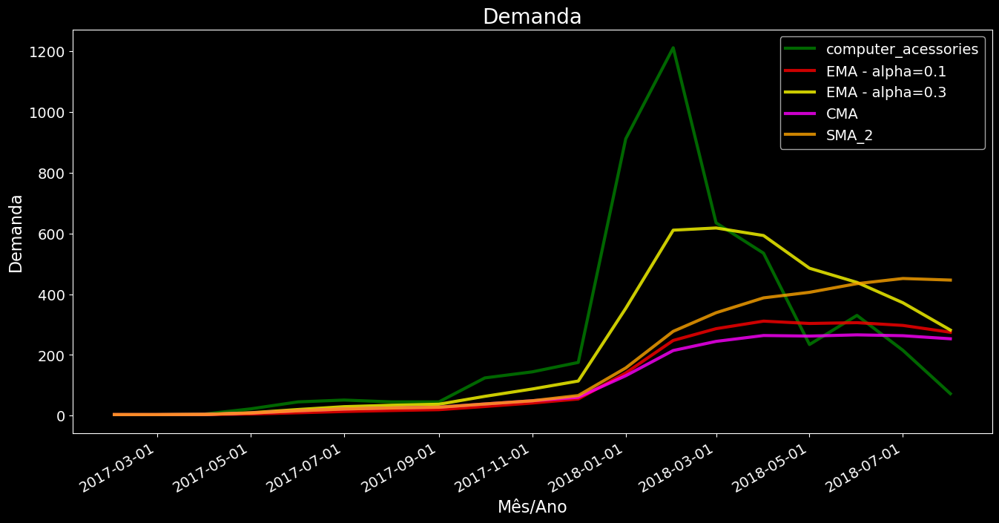

In [40]:
# Let's smoothing factor - 0.1
df_com['EMA_0.1'] = df_com.customers.ewm(alpha=0.1, adjust=False).mean()
# Let's smoothing factor  - 0.3
df_com['EMA_0.3'] = df_com.customers.ewm(alpha=0.3, adjust=False).mean()
# CMA
df_com['CMA'] = df_com.customers.expanding().mean()
# SMA over a period of 2 years 
df_com['SMA_2'] = df_com.customers.rolling(10, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_com['customers'], color='green', linewidth=3, alpha=0.8)
ax.plot(df_com['EMA_0.1'], color='red', linewidth=3, alpha=0.8)
ax.plot(df_com['EMA_0.3'], color='yellow', linewidth=3, alpha=0.8)
ax.plot(df_com['CMA'], color='magenta', linewidth=3, alpha=0.8)
ax.plot(df_com['SMA_2'], color='orange', linewidth=3, alpha=0.8)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(labels=['computer_acessories', 'EMA - alpha=0.1', 'EMA - alpha=0.3', 'CMA', 'SMA_2'], fontsize=14)
plt.title('Demanda', fontsize=20)
plt.xlabel('Mês/Ano', fontsize=16)
plt.ylabel('Demanda', fontsize=16)

date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.show()

### repetindo a análise para a categoria health_beauty

In [41]:
df_hea.drop(['product_category_name','year','month'], axis=1, inplace=True)
df_hea.set_index('data', inplace=True)
df_hea

,customers
data,
2017-01-01,18
2017-02-01,57
2017-03-01,100
2017-04-01,69
2017-05-01,164
2017-06-01,212
2017-07-01,244
2017-08-01,492
2017-09-01,534


### Aplicando a metodologia de média móvel para modular a distribuição (health_beauty)
### Média Móvel Simples (SMA),
### Média Móvel Cumulativa (CMA)
### Média Móvel Exponencial (EMA)

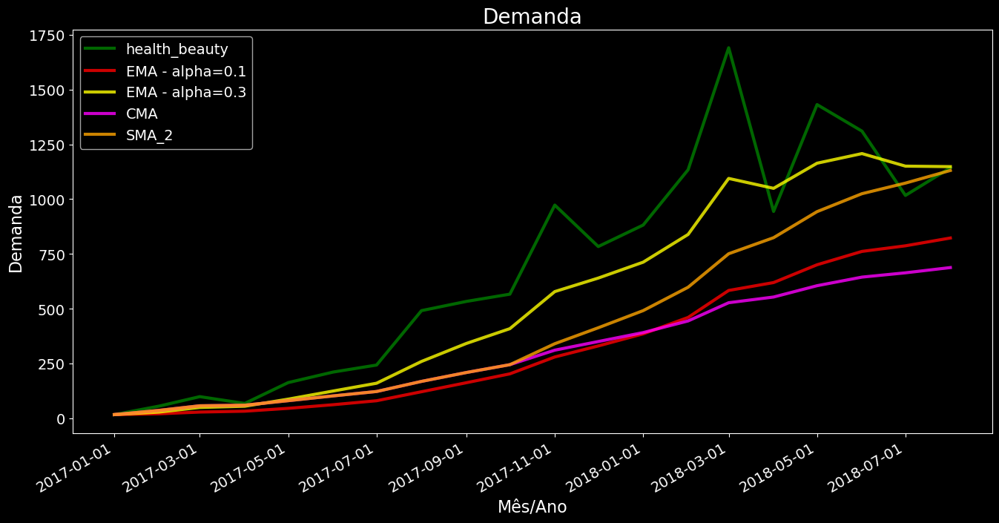

In [42]:
# Let's smoothing factor - 0.1
df_hea['EMA_0.1'] = df_hea.customers.ewm(alpha=0.1, adjust=False).mean()
# Let's smoothing factor  - 0.3
df_hea['EMA_0.3'] = df_hea.customers.ewm(alpha=0.3, adjust=False).mean()
# CMA
df_hea['CMA'] = df_hea.customers.expanding().mean()
# SMA over a period of 2 years 
df_hea['SMA_2'] = df_hea.customers.rolling(10, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_hea['customers'], color='green', linewidth=3, alpha=0.8)
ax.plot(df_hea['EMA_0.1'], color='red', linewidth=3, alpha=0.8)
ax.plot(df_hea['EMA_0.3'], color='yellow', linewidth=3, alpha=0.8)
ax.plot(df_hea['CMA'], color='magenta', linewidth=3, alpha=0.8)
ax.plot(df_hea['SMA_2'], color='orange', linewidth=3, alpha=0.8)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(labels=['health_beauty', 'EMA - alpha=0.1', 'EMA - alpha=0.3', 'CMA', 'SMA_2'], fontsize=14)
plt.title('Demanda', fontsize=20)
plt.xlabel('Mês/Ano', fontsize=16)
plt.ylabel('Demanda', fontsize=16)

date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.show()

In [43]:
df_hea_EMA = df_hea.copy()
df_hea_EMA.drop(['EMA_0.1','EMA_0.3','CMA','SMA_2'], axis=1, inplace=True)
df_hea_EMA

,customers
data,
2017-01-01,18
2017-02-01,57
2017-03-01,100
2017-04-01,69
2017-05-01,164
2017-06-01,212
2017-07-01,244
2017-08-01,492
2017-09-01,534


### testando o modelo Exponentially Weighted Moving Average (EWMA) na categoria health_beauty

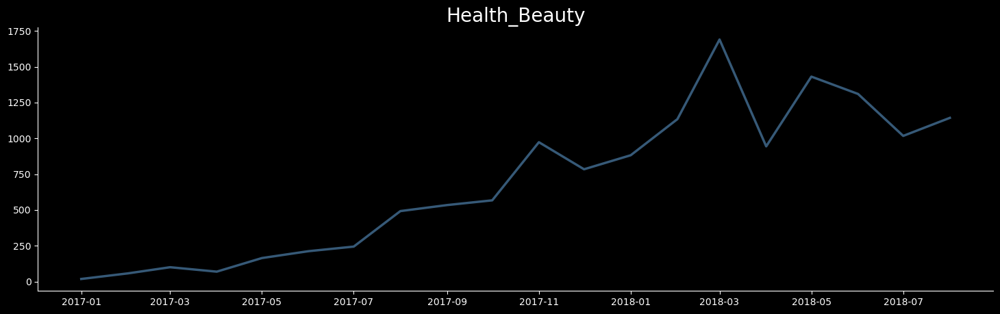

In [44]:
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import rcParams
from cycler import cycler

rcParams['figure.figsize'] = 18, 5
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['axes.prop_cycle'] = cycler(color=['#365977'])
rcParams['lines.linewidth'] = 2.5

# Plot
plt.title('Health_Beauty', size=20)
plt.plot(df_hea_EMA['customers'], label='Original')

### Implementando EWMA model com três versões diferentes com o parâmetro span

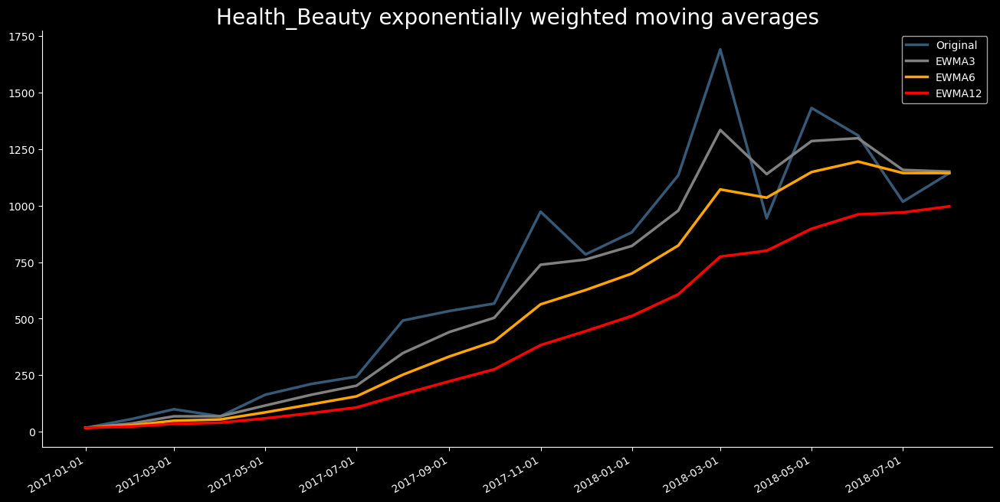

In [45]:
# Calculate
df_hea_EMA['EWMA3'] = df_hea_EMA['customers'].ewm(span=3, adjust=False).mean()
df_hea_EMA['EWMA6'] = df_hea_EMA['customers'].ewm(span=6, adjust=False).mean()
df_hea_EMA['EWMA12'] = df_hea_EMA['customers'].ewm(span=12, adjust=False).mean()

# Plot
fig, ax = plt.subplots(figsize=(16, 8))
plt.title('Health_Beauty exponentially weighted moving averages', size=20)
ax.plot(df_hea_EMA['customers'], label='Original')
ax.plot(df_hea_EMA['EWMA3'], color='gray', label='EWMA3')
ax.plot(df_hea_EMA['EWMA6'], color='orange', label='EWMA6')
ax.plot(df_hea_EMA['EWMA12'], color='red', label='EWMA12')
plt.legend();
date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()

### Utilizando o modelo EWMA para predições
### criados os datasets de treino e teste
### o modelo foi treinado e validado no dataset de teste

C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


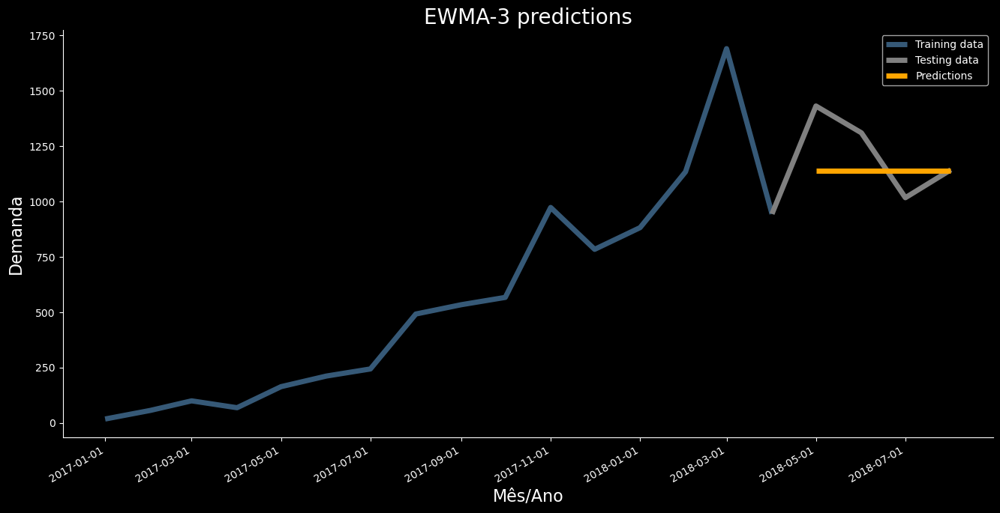

In [46]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

# Model parameters
span = 3 #12
alpha = 2 / (span + 1)

# Train/test split (df)
df_train = df_hea_EMA[df_hea_EMA.index <= pd.to_datetime("2018-04-01", format='%Y-%m-%d')]
df_test = df_hea_EMA[df_hea_EMA.index >= pd.to_datetime("2018-04-01", format='%Y-%m-%d')]
# Train the model
model = SimpleExpSmoothing(df_train['customers'])
results = model.fit(smoothing_level=alpha, optimized=False)
predictions = results.forecast(steps=4)#12

# Plot
fig, ax = plt.subplots(figsize=(16, 8))
plt.title('EWMA-3 predictions', size=20)
ax.plot(df_train['customers'], label='Training data',linewidth=5., solid_capstyle='butt')
ax.plot(df_test['customers'], color='gray', label='Testing data',linewidth=5., solid_capstyle='butt')
ax.plot(predictions, color='orange', label='Predictions',linewidth=5., solid_capstyle='butt')
plt.legend();
date_form = mdates.DateFormatter("%Y-%m-%d")
ax.xaxis.set_major_formatter(date_form)
plt.gcf().autofmt_xdate()
plt.xlabel('Mês/Ano', fontsize=16)
plt.ylabel('Demanda', fontsize=16)
plt.show()

In [47]:
df_train

,customers,EWMA3,EWMA6,EWMA12
data,,,,
2017-01-01,18,18.00,18.00,18.00
2017-02-01,57,37.50,29.14,24.00
2017-03-01,100,68.75,49.39,35.69
2017-04-01,69,68.88,54.99,40.82
2017-05-01,164,116.44,86.14,59.77
2017-06-01,212,164.22,122.10,83.19
2017-07-01,244,204.11,156.93,107.93
2017-08-01,492,348.05,252.66,167.02
2017-09-01,534,441.03,333.04,223.48


In [48]:
df_test

,customers,EWMA3,EWMA6,EWMA12
data,,,,
2018-04-01,944,1138.95,1034.86,800.53
2018-05-01,1431,1284.98,1148.05,897.52
2018-06-01,1310,1297.49,1194.32,960.98
2018-07-01,1017,1157.24,1143.66,969.60
2018-08-01,1143,1150.12,1143.47,996.28


# Auto-Regressive models
### Autoregressive moving average (ARMA)
### AutoRegressive Integrated Moving Average (ARIMA)
### Seasonal Auto-Regressive Integrated Moving Average (SARIMA)

In [49]:
btc = df_hea.copy()
btc.drop(['EMA_0.1','EMA_0.3','CMA','SMA_2'], axis=1, inplace=True)
btc

,customers
data,
2017-01-01,18
2017-02-01,57
2017-03-01,100
2017-04-01,69
2017-05-01,164
2017-06-01,212
2017-07-01,244
2017-08-01,492
2017-09-01,534


### setup do Seaborn

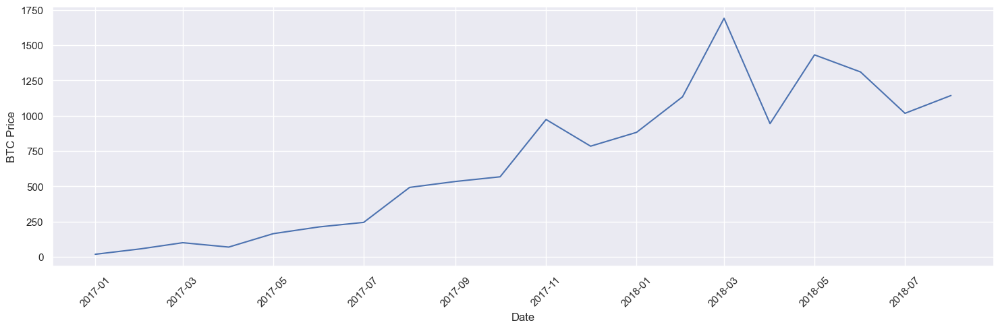

In [50]:
sns.set()
plt.ylabel('BTC Price')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.plot(btc.index, btc['customers'], )

### plotando os datasets de treino (preto) e teste (vermelho)

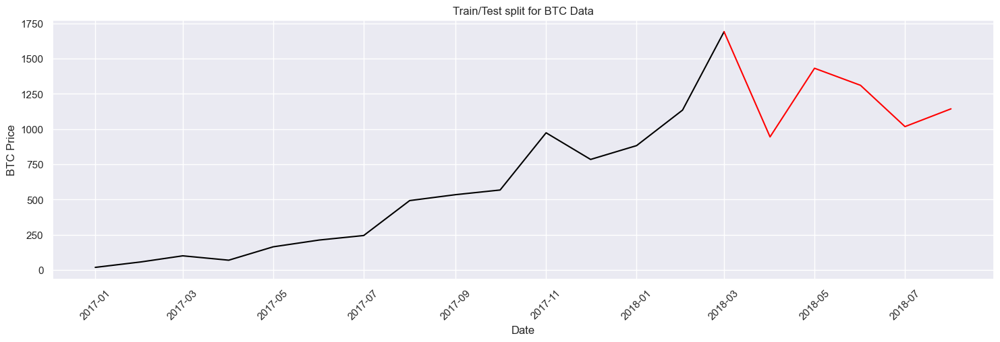

In [51]:
train = btc[btc.index <= pd.to_datetime("2018-03-01", format='%Y-%m-%d')]
test = btc[btc.index >= pd.to_datetime("2018-03-01", format='%Y-%m-%d')]

plt.plot(train, color = "black")
plt.plot(test, color = "red")
plt.ylabel('BTC Price')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.title("Train/Test split for BTC Data")
plt.show()

### Implementando ARMA model no dataset de treino
### e validando seu desempenho no dataset de teste

C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


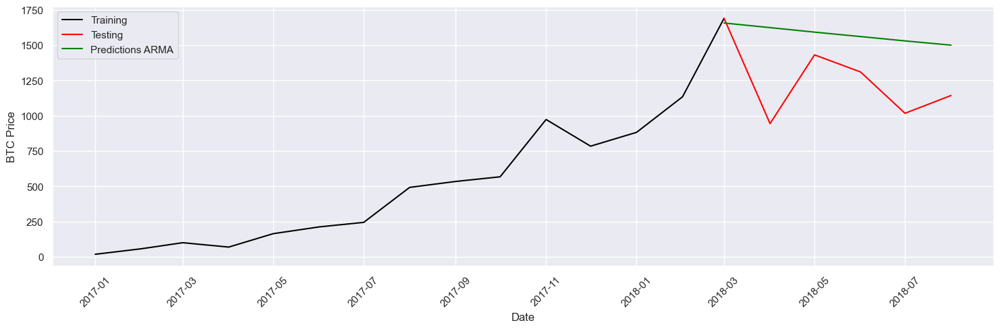

In [52]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

y = train['customers']
ARMAmodel = SARIMAX(y, order = (1, 0, 0))
ARMAmodel = ARMAmodel.fit()

y_pred = ARMAmodel.get_forecast(len(test.index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions_ARMA"] = ARMAmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test.index
y_pred_ARMA = y_pred_df["Predictions_ARMA"] 

plt.plot(train, color = "black", label = 'Training')
plt.plot(test, color = "red", label = 'Testing')
plt.plot(y_pred_ARMA, color='green', label = 'Predictions ARMA')
plt.legend()
plt.ylabel('BTC Price')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.show()

### Implementando ARIMA model no dataset de treino
### e validando seu desempenho no dataset de teste

C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


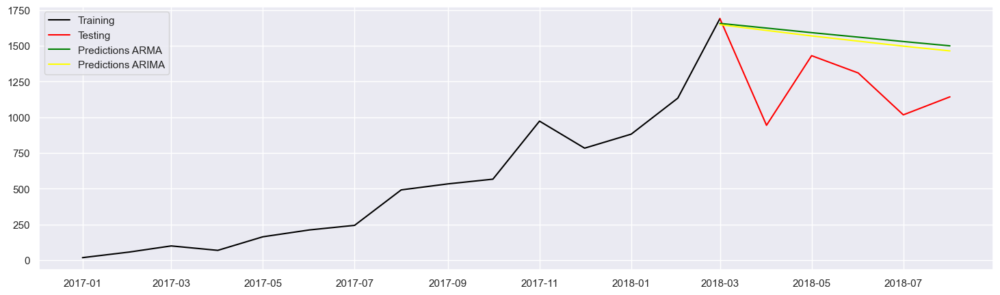

In [53]:
from statsmodels.tsa.arima.model import ARIMA

ARIMAmodel = ARIMA(y, order = (1,0,0))
ARIMAmodel = ARIMAmodel.fit()

y_pred = ARIMAmodel.get_forecast(len(test.index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions_ARIMA"] = ARIMAmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test.index
y_pred_ARIMA = y_pred_df["Predictions_ARIMA"] 

plt.plot(train, color = "black", label = 'Training')
plt.plot(test, color = "red", label = 'Testing')
plt.plot(y_pred_ARMA, color='green', label = 'Predictions ARMA')
plt.plot(y_pred_ARIMA, color='Yellow', label = 'Predictions ARIMA')
plt.legend()

### Implementando SAIRMA model no dataset de treino
### e validando seu desempenho no dataset de teste

C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\anefa\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


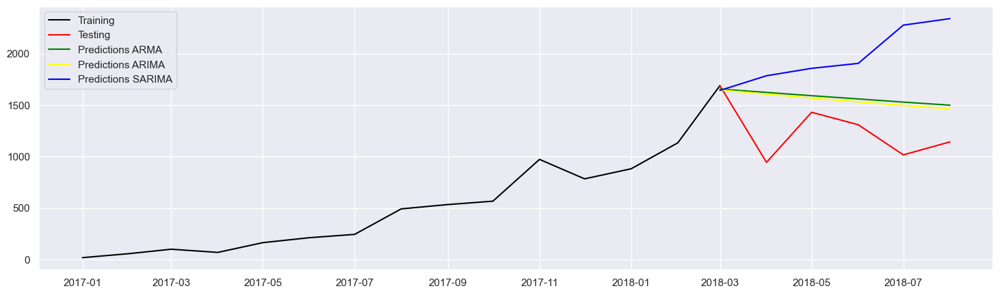

In [54]:
SARIMAXmodel = SARIMAX(y, order = (2,1,1), seasonal_order=(2,2,2,12), enforce_stationarity=True, enforce_invertibility=False)
SARIMAXmodel = SARIMAXmodel.fit()

y_pred = SARIMAXmodel.get_forecast(len(test.index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions_SARIMA"] = SARIMAXmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test.index
y_pred_SARIMA = y_pred_df["Predictions_SARIMA"]

plt.plot(train, color = "black", label = 'Training')
plt.plot(test, color = "red", label = 'Testing')
plt.plot(y_pred_ARMA, color='green', label = 'Predictions ARMA')
plt.plot(y_pred_ARIMA, color='Yellow', label = 'Predictions ARIMA')
plt.plot(y_pred_SARIMA, color='Blue', label = 'Predictions SARIMA')
plt.legend()

# Prophet

In [55]:
import prophet as fbp
from prophet import Prophet
from prophet.plot import plot_plotly, add_changepoints_to_plot

### criando o df de health_beauty do df de backup

In [56]:
df_hea3 = df_hea_back[['data','customers']]
df_hea3.rename(columns={"data":"ds","customers": "y"}, inplace=True)
df_hea3.head()

,ds,y
102,2017-01-01,18
103,2017-02-01,57
104,2017-03-01,100
105,2017-04-01,69
106,2017-05-01,164


### set the uncertainty interval to 95% (the Prophet default is 80%)

In [57]:
my_model = Prophet(interval_width=0.95)

### fitando o modelo

In [58]:
my_model.fit(df_hea3)

13:10:00 - cmdstanpy - INFO - Chain [1] start processing
13:10:00 - cmdstanpy - INFO - Chain [1] done processing


### definindo as datas para o forecast

In [59]:
future_dates = my_model.make_future_dataframe(periods=3, freq='MS')
future_dates.head()

,ds
0,2017-01-01
1,2017-02-01
2,2017-03-01
3,2017-04-01
4,2017-05-01


### predict do modelo

In [60]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2017-01-01,-58.48,-454.02,351.36
1,2017-02-01,21.86,-383.02,410.15
2,2017-03-01,94.43,-319.29,502.46
3,2017-04-01,174.78,-255.19,592.81
4,2017-05-01,252.53,-166.97,631.11


### visualização do trend do modelo

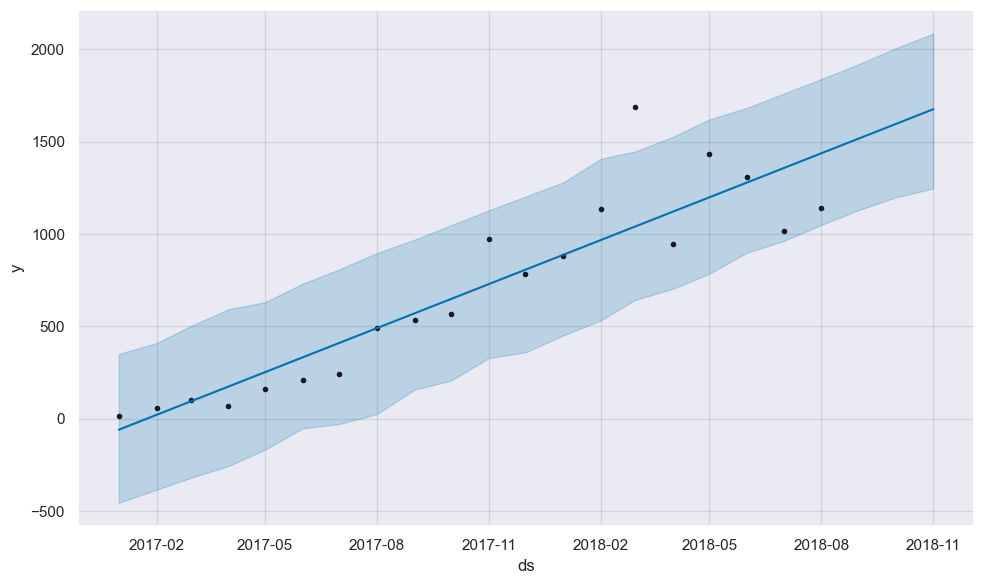

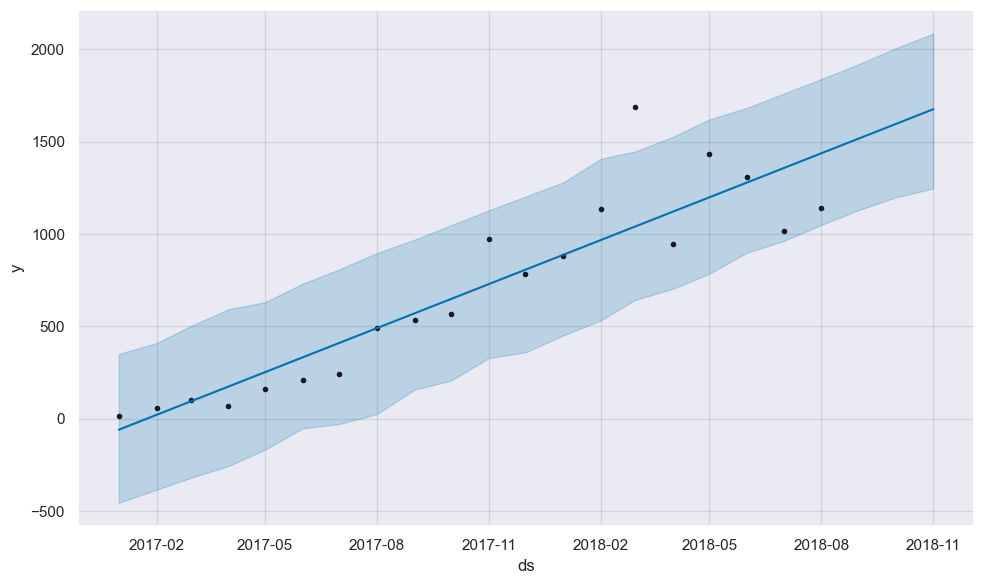

In [61]:
my_model.plot(forecast, uncertainty=True)

### visualizando a distribuição dos componentes do modelo

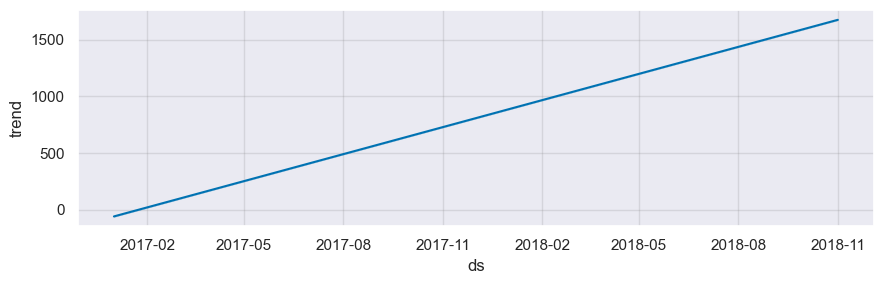

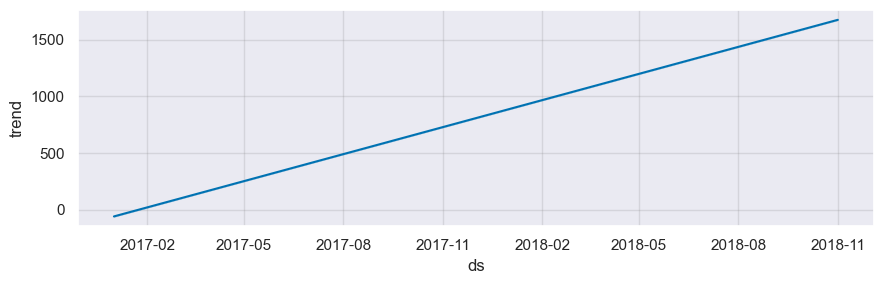

In [62]:
my_model.plot_components(forecast)

### same as previous

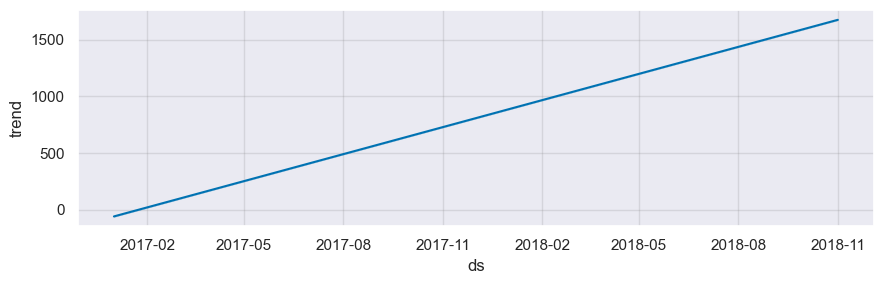

In [63]:
fig1 = my_model.plot_components(forecast)

# Adding ChangePoints to Prophet

### adicionando ChangePoints ao modelo Prophet

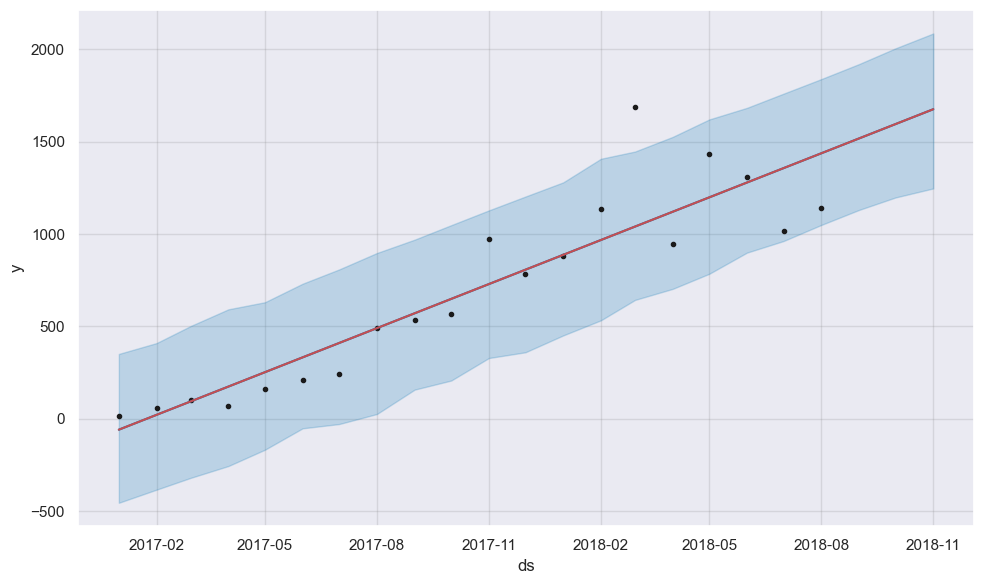

In [64]:
fig = my_model.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), my_model, forecast)

### print dos ChangePoints

In [65]:
my_model.changepoints

1    2017-02-01
2    2017-03-01
3    2017-04-01
4    2017-05-01
5    2017-06-01
6    2017-07-01
7    2017-08-01
8    2017-09-01
9    2017-10-01
10   2017-11-01
11   2017-12-01
12   2018-01-01
13   2018-02-01
14   2018-03-01
15   2018-04-01
Name: ds, dtype: datetime64[ns]

### definindo o range dos ChangePoints

13:10:03 - cmdstanpy - INFO - Chain [1] start processing
13:10:03 - cmdstanpy - INFO - Chain [1] done processing


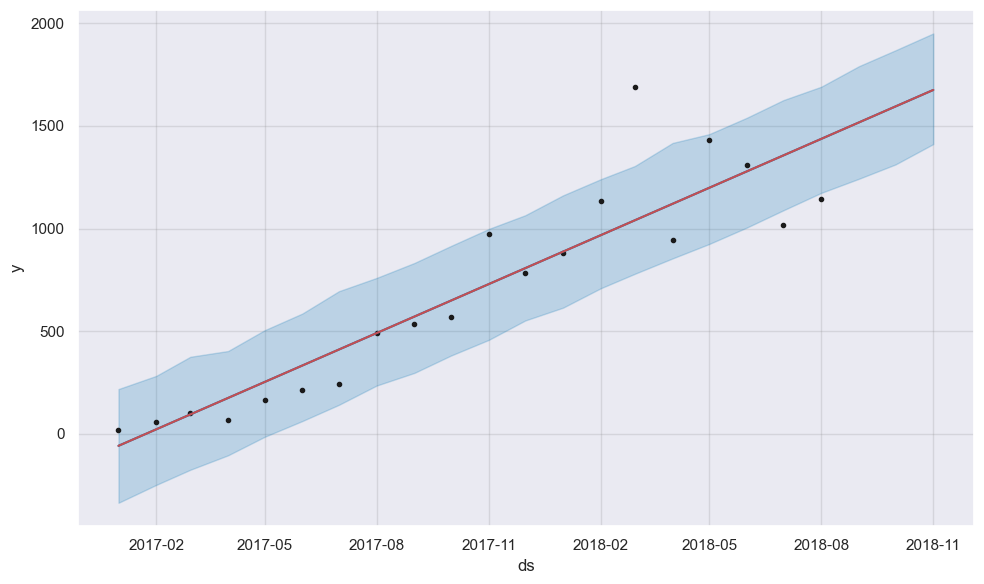

In [66]:
pro_change= Prophet(changepoint_range=0.9)
forecast = pro_change.fit(df_hea3).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### adicionando número de ChangePoints e sazonalidade anual

13:10:03 - cmdstanpy - INFO - Chain [1] start processing
13:10:16 - cmdstanpy - INFO - Chain [1] done processing


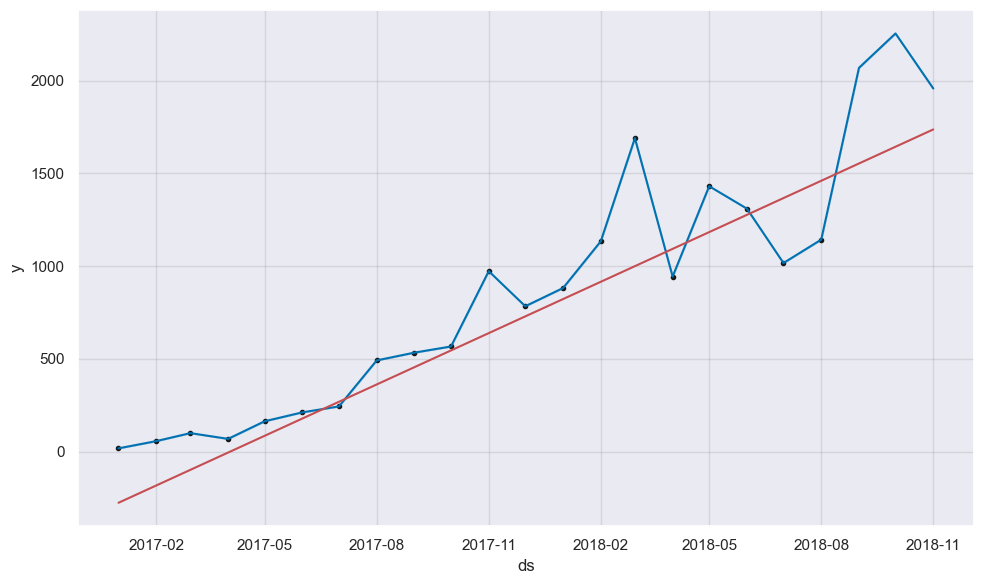

In [67]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True)
forecast = pro_change.fit(df_hea3).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### print do forecast

In [68]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-01,-275.50,17.99,17.99,-275.50,-275.50,293.49,293.49,293.49,293.49,293.49,293.49,0.00,0.00,0.00,17.99
1,2017-02-01,-182.25,56.99,56.99,-182.25,-182.25,239.24,239.24,239.24,239.24,239.24,239.24,0.00,0.00,0.00,56.99
2,2017-03-01,-98.03,100.02,100.02,-98.03,-98.03,198.04,198.04,198.04,198.04,198.04,198.04,0.00,0.00,0.00,100.02
3,2017-04-01,-4.78,69.02,69.02,-4.78,-4.78,73.80,73.80,73.80,73.80,73.80,73.80,0.00,0.00,0.00,69.02
4,2017-05-01,85.46,163.99,163.99,85.46,85.46,78.53,78.53,78.53,78.53,78.53,78.53,0.00,0.00,0.00,163.99
5,2017-06-01,178.71,211.99,211.99,178.71,178.71,33.28,33.28,33.28,33.28,33.28,33.28,0.00,0.00,0.00,211.99
6,2017-07-01,268.95,244.00,244.00,268.95,268.95,-24.96,-24.96,-24.96,-24.96,-24.96,-24.96,0.00,0.00,0.00,244.00
7,2017-08-01,362.20,491.99,491.99,362.20,362.20,129.79,129.79,129.79,129.79,129.79,129.79,0.00,0.00,0.00,491.99
8,2017-09-01,455.45,534.00,534.00,455.45,455.45,78.55,78.55,78.55,78.55,78.55,78.55,0.00,0.00,0.00,534.00
9,2017-10-01,545.69,567.02,567.02,545.69,545.69,21.33,21.33,21.33,21.33,21.33,21.33,0.00,0.00,0.00,567.02


### adicionando parâmetro "changepoint_prior_scale"

13:10:17 - cmdstanpy - INFO - Chain [1] start processing
13:10:17 - cmdstanpy - INFO - Chain [1] done processing


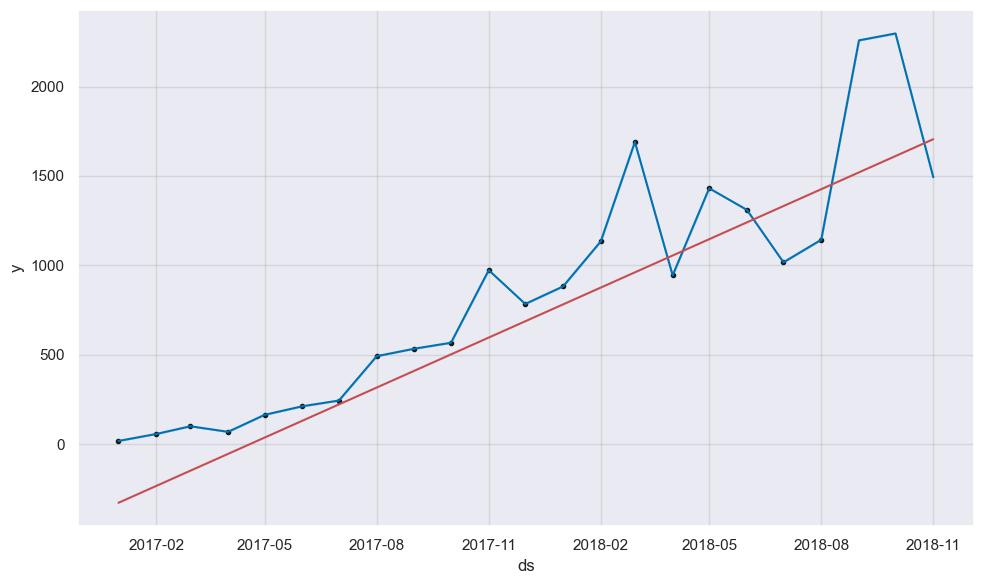

In [69]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True, changepoint_prior_scale=0.001)
forecast = pro_change.fit(df_hea3).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### print do forecast

In [70]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-01,-327.90,17.99,17.99,-327.90,-327.90,345.88,345.88,345.88,345.88,345.88,345.88,0.00,0.00,0.00,17.99
1,2017-02-01,-233.68,56.97,56.97,-233.68,-233.68,290.66,290.66,290.66,290.66,290.66,290.66,0.00,0.00,0.00,56.97
2,2017-03-01,-148.59,100.01,100.01,-148.59,-148.59,248.60,248.60,248.60,248.60,248.60,248.60,0.00,0.00,0.00,100.01
3,2017-04-01,-54.38,69.01,69.01,-54.38,-54.38,123.38,123.38,123.38,123.38,123.38,123.38,0.00,0.00,0.00,69.01
4,2017-05-01,36.80,164.02,164.02,36.80,36.80,127.23,127.23,127.23,127.23,127.23,127.23,0.00,0.00,0.00,164.02
5,2017-06-01,131.01,212.00,212.00,131.01,131.01,81.00,81.00,81.00,81.00,81.00,81.00,0.00,0.00,0.00,212.00
6,2017-07-01,222.18,243.97,243.97,222.18,222.18,21.79,21.79,21.79,21.79,21.79,21.79,0.00,0.00,0.00,243.97
7,2017-08-01,316.39,492.00,492.00,316.39,316.39,175.61,175.61,175.61,175.61,175.61,175.61,0.00,0.00,0.00,492.00
8,2017-09-01,410.61,534.00,534.00,410.61,410.61,123.39,123.39,123.39,123.39,123.39,123.39,0.00,0.00,0.00,534.00
9,2017-10-01,501.78,567.01,567.01,501.78,501.78,65.23,65.23,65.23,65.23,65.23,65.23,0.00,0.00,0.00,567.01


## Demanda por produto

### visualizando o dataset completo

In [71]:
df.head(20)

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,01-05-2017,1,45.95,15.10,45.95,39,161,2,350,4.00,57,23,8,1,5,2017,10.27,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,01-06-2017,3,137.85,12.93,45.95,39,161,2,350,4.00,61,22,8,1,6,2017,6.50,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,01-07-2017,6,275.70,14.84,45.95,39,161,2,350,4.00,123,21,10,1,7,2017,12.07,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,01-08-2017,4,183.80,14.29,45.95,39,161,2,350,4.00,90,23,8,1,8,2017,9.29,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,01-09-2017,2,91.90,15.10,45.95,39,161,2,350,4.00,54,21,9,1,9,2017,5.56,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95
5,bed1,bed_bath_table,01-10-2017,3,137.85,15.10,45.95,39,161,2,350,4.00,50,22,9,2,10,2017,8.33,3800,89.90,3.90,21.57,45.95,4.00,15.10,45.95,4.00,15.10,45.95
6,bed1,bed_bath_table,01-11-2017,11,445.85,15.83,40.53,39,161,2,350,4.00,97,22,8,4,11,2017,30.56,3800,89.90,3.90,16.29,40.53,4.00,15.83,40.53,4.00,15.83,45.95
7,bed1,bed_bath_table,01-12-2017,6,239.94,15.23,39.99,39,161,2,350,4.00,41,21,10,1,12,2017,16.67,3800,88.49,3.90,18.90,39.99,4.00,15.23,39.99,4.00,15.23,40.53
8,bed1,bed_bath_table,01-01-2018,19,759.81,16.53,39.99,39,161,2,350,4.00,62,23,8,2,1,2018,17.76,3800,86.90,3.90,19.38,39.99,4.00,16.53,39.99,4.00,16.53,39.99
9,bed1,bed_bath_table,01-02-2018,18,719.82,13.75,39.99,39,161,2,350,4.00,62,20,8,2,2,2018,16.82,3800,86.90,3.90,19.21,39.99,4.00,13.75,39.99,4.00,13.75,39.99


### definindo df da categoria "health_beauty"

In [72]:
df_heaA = df[df['product_category_name']=='health_beauty']
df_heaA.head(20)

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
58,health9,health_beauty,01-02-2017,11,219.89,11.75,19.99,48,575,1,100,4.30,19,20,8,2,2,2017,14.94,4500,19.99,4.30,11.75,19.99,4.30,11.75,64.99,3.90,15.35,19.94
59,health9,health_beauty,01-03-2017,9,179.91,13.82,19.99,48,575,1,100,4.30,25,23,8,1,3,2017,9.14,4500,19.99,4.30,13.82,89.99,4.10,13.02,64.99,3.90,17.26,19.99
60,health9,health_beauty,01-04-2017,13,259.87,18.04,19.99,48,575,1,100,4.30,23,20,10,2,4,2017,5.78,4500,19.99,4.30,18.04,19.99,4.30,18.04,64.99,3.90,15.17,19.99
61,health9,health_beauty,01-05-2017,16,319.84,14.85,19.99,48,575,1,100,4.30,41,23,8,1,5,2017,9.81,4500,19.99,4.30,14.85,89.99,4.10,16.10,64.99,3.90,14.81,19.99
62,health9,health_beauty,01-06-2017,21,419.79,12.68,19.99,48,575,1,100,4.30,53,22,8,1,6,2017,7.35,4500,19.99,4.30,12.68,89.99,4.10,14.16,58.80,3.90,13.90,19.99
63,health9,health_beauty,01-07-2017,29,579.71,11.14,19.99,48,575,1,100,4.30,61,21,10,1,7,2017,9.12,4500,19.99,4.30,11.14,89.99,4.10,12.12,59.26,3.90,18.00,19.99
64,health9,health_beauty,01-08-2017,28,651.72,14.28,23.40,48,575,1,100,4.30,82,23,8,1,8,2017,8.01,4500,23.40,4.30,14.28,89.99,4.10,13.41,58.99,3.90,16.24,19.99
65,health9,health_beauty,01-09-2017,24,575.76,16.12,23.99,48,575,1,100,4.30,89,21,9,1,9,2017,10.67,4500,23.99,4.30,16.12,89.99,4.10,13.96,58.99,3.90,15.64,23.40
66,health9,health_beauty,01-10-2017,27,647.73,13.14,23.99,48,575,1,100,4.30,81,22,9,2,10,2017,12.00,4500,23.99,4.30,13.14,89.99,4.10,16.56,58.99,3.90,19.07,23.99
67,health9,health_beauty,01-11-2017,28,671.72,12.38,23.99,48,575,1,100,4.30,139,22,8,4,11,2017,12.44,4500,23.99,4.30,12.38,89.99,4.10,16.99,58.99,3.90,15.71,23.99


In [73]:
df_heaA.product_id.unique()

array(['health9', 'health3', 'health8', 'health6', 'health10', 'health1',
       'health5', 'health7', 'health2', 'health4'], dtype=object)

### visualizando a frequência dos produtos desta categoria

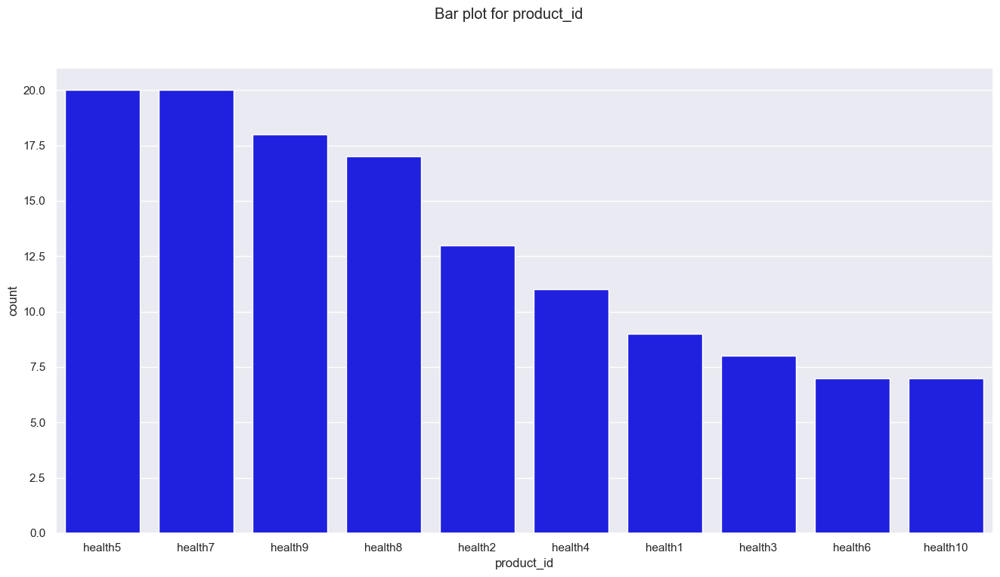

In [74]:
fig, axes = plt.subplots(figsize = (16, 8))
fig.suptitle('Bar plot for product_id')
sns.countplot(x = 'product_id', data = df_heaA, color = 'blue', 
              order = df_heaA['product_id'].value_counts().index);
sns.set_style("dark")

### eliminando colunas desnecessárias

In [75]:
df_heaA.drop(['month_year','product_name_lenght','product_description_lenght',
             'product_photos_qty','product_weight_g','s'], axis=1, inplace=True)
df_heaA.head()

,product_id,product_category_name,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
58,health9,health_beauty,11,219.89,11.75,19.99,4.30,19,20,8,2,2,2017,4500,19.99,4.30,11.75,19.99,4.30,11.75,64.99,3.90,15.35,19.94
59,health9,health_beauty,9,179.91,13.82,19.99,4.30,25,23,8,1,3,2017,4500,19.99,4.30,13.82,89.99,4.10,13.02,64.99,3.90,17.26,19.99
60,health9,health_beauty,13,259.87,18.04,19.99,4.30,23,20,10,2,4,2017,4500,19.99,4.30,18.04,19.99,4.30,18.04,64.99,3.90,15.17,19.99
61,health9,health_beauty,16,319.84,14.85,19.99,4.30,41,23,8,1,5,2017,4500,19.99,4.30,14.85,89.99,4.10,16.10,64.99,3.90,14.81,19.99
62,health9,health_beauty,21,419.79,12.68,19.99,4.30,53,22,8,1,6,2017,4500,19.99,4.30,12.68,89.99,4.10,14.16,58.80,3.90,13.90,19.99


### criando df para o produto "health5"

In [76]:
df_heaB = df_heaA[df_heaA['product_id']=='health5']
df_heaB.head()

,product_id,product_category_name,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
339,health5,health_beauty,8,2799.20,22.90,349.90,4.30,9,22,9,1,1,2017,11400,349.90,4.30,22.90,349.90,4.30,22.90,64.99,3.90,11.06,349.85
340,health5,health_beauty,4,1399.60,26.93,349.90,4.30,19,20,8,2,2,2017,11400,19.99,4.30,11.75,349.90,4.30,26.93,64.99,3.90,15.35,349.90
341,health5,health_beauty,2,699.80,21.27,349.90,4.30,25,23,8,1,3,2017,11400,19.99,4.30,13.82,89.99,4.10,13.02,64.99,3.90,17.26,349.90
342,health5,health_beauty,1,349.90,19.29,349.90,4.30,23,20,10,2,4,2017,11400,19.99,4.30,18.04,349.90,4.30,19.29,64.99,3.90,15.17,349.90
343,health5,health_beauty,4,1399.60,26.73,349.90,4.30,41,23,8,1,5,2017,11400,19.99,4.30,14.85,89.99,4.10,16.10,64.99,3.90,14.81,349.90


### criando df com as datas e demandas

In [77]:
df_heaC = df_heaB.groupby(['product_id','year','month']).agg({'customers':pd.Series.mean})
df_heaC = df_heaC.reset_index()
df_heaC['data'] = pd.to_datetime(df_heaC.year.astype(str) + '/' + df_heaC.month.astype(str))
df_heaC.head()

,product_id,year,month,customers,data
0,health5,2017,1,9.00,2017-01-01
1,health5,2017,2,19.00,2017-02-01
2,health5,2017,3,25.00,2017-03-01
3,health5,2017,4,23.00,2017-04-01
4,health5,2017,5,41.00,2017-05-01


In [78]:
df_heaD = df_heaC[['data','customers']]
df_heaD.head()

,data,customers
0,2017-01-01,9.00
1,2017-02-01,19.00
2,2017-03-01,25.00
3,2017-04-01,23.00
4,2017-05-01,41.00


### renomeando as colunas

In [79]:
df_heaD.rename(columns={"data":"ds","customers": "y"}, inplace=True)
df_heaD.head()

,ds,y
0,2017-01-01,9.00
1,2017-02-01,19.00
2,2017-03-01,25.00
3,2017-04-01,23.00
4,2017-05-01,41.00


### set the uncertainty interval to 95% (the Prophet default is 80%)

In [80]:
my_model = Prophet(interval_width=0.95)

### fitando o modelo

In [81]:
my_model.fit(df_heaD)

13:10:18 - cmdstanpy - INFO - Chain [1] start processing
13:10:18 - cmdstanpy - INFO - Chain [1] done processing


### definindo datas para o forecast

In [82]:
future_dates = my_model.make_future_dataframe(periods=3, freq='MS')
future_dates.tail()

,ds
18,2018-07-01
19,2018-08-01
20,2018-09-01
21,2018-10-01
22,2018-11-01


### fazendo o predict

In [83]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2017-01-01,19.32,-22.81,59.12
1,2017-02-01,26.79,-12.44,62.71
2,2017-03-01,33.53,-7.19,72.19
3,2017-04-01,41.00,-1.16,83.23
4,2017-05-01,48.22,8.98,90.59


### visualizando o trend do modelo

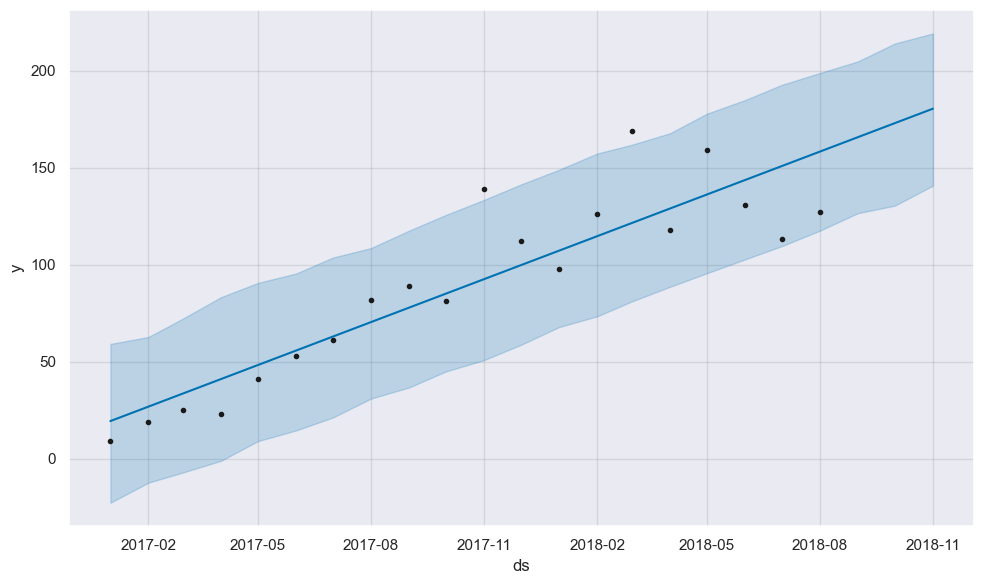

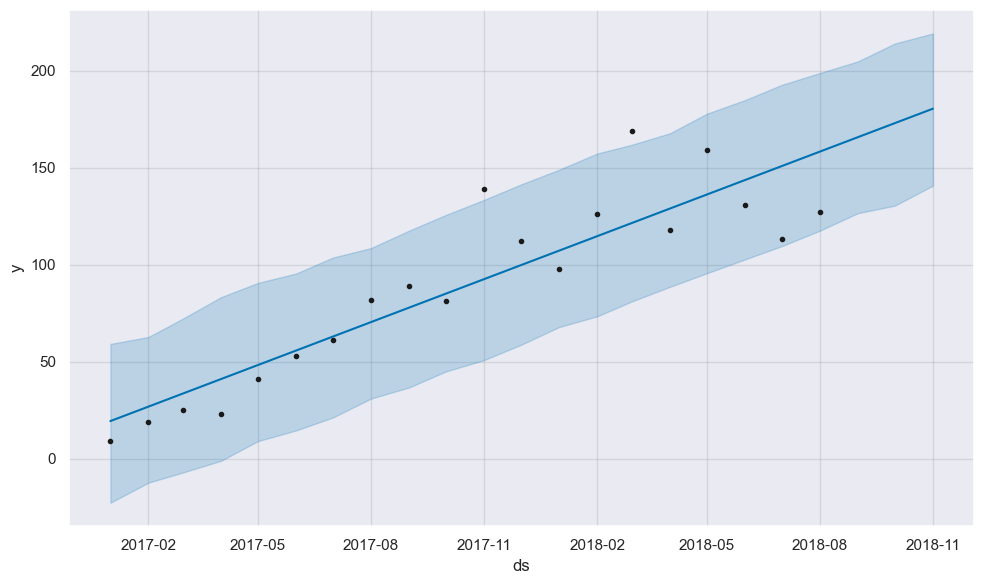

In [84]:
my_model.plot(forecast, uncertainty=True)

### visualizando os componentes do modelo

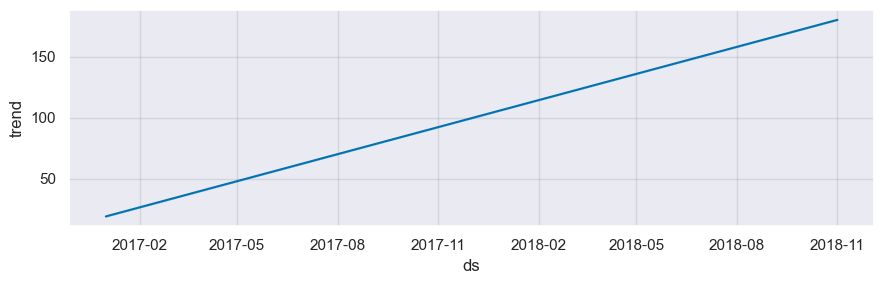

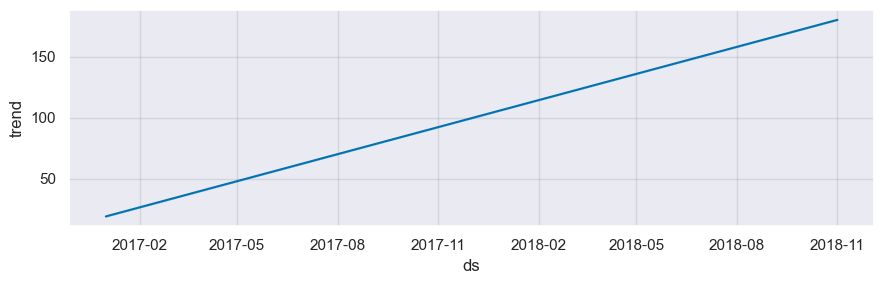

In [85]:
my_model.plot_components(forecast)

### same as previous

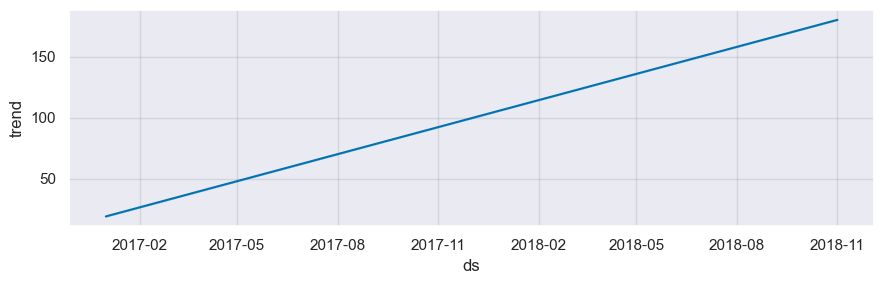

In [86]:
fig1 = my_model.plot_components(forecast)

# Adding ChangePoints to Prophet

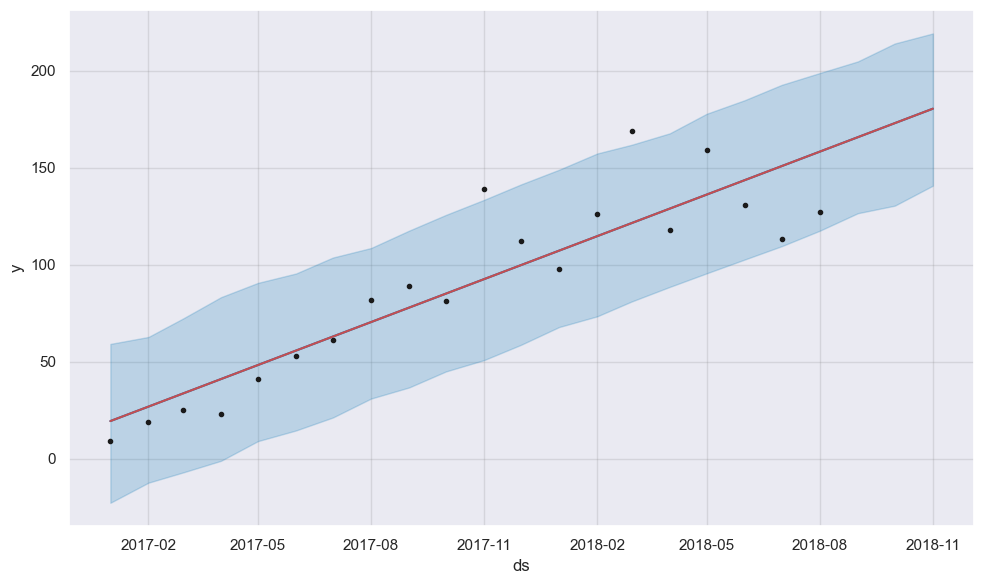

In [87]:
fig = my_model.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), my_model, forecast)

In [88]:
my_model.changepoints

1    2017-02-01
2    2017-03-01
3    2017-04-01
4    2017-05-01
5    2017-06-01
6    2017-07-01
7    2017-08-01
8    2017-09-01
9    2017-10-01
10   2017-11-01
11   2017-12-01
12   2018-01-01
13   2018-02-01
14   2018-03-01
15   2018-04-01
Name: ds, dtype: datetime64[ns]

### definindo o range dos ChangePoints

13:10:21 - cmdstanpy - INFO - Chain [1] start processing
13:10:21 - cmdstanpy - INFO - Chain [1] done processing


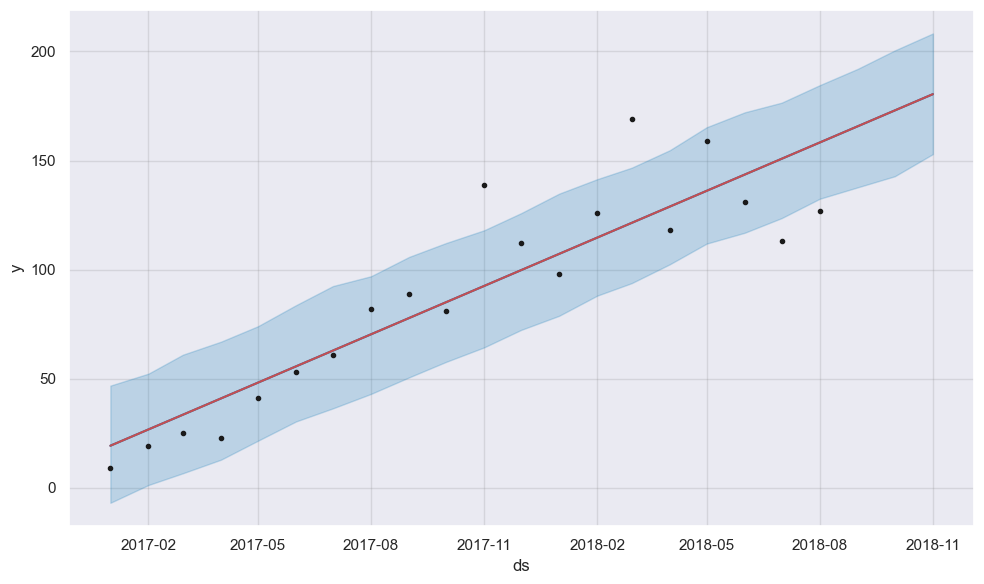

In [89]:
pro_change= Prophet(changepoint_range=0.9)
forecast = pro_change.fit(df_heaD).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### acrescentando o número máximo de ChangePoints e sazonalidade anual

13:10:21 - cmdstanpy - INFO - Chain [1] start processing
13:10:22 - cmdstanpy - INFO - Chain [1] done processing


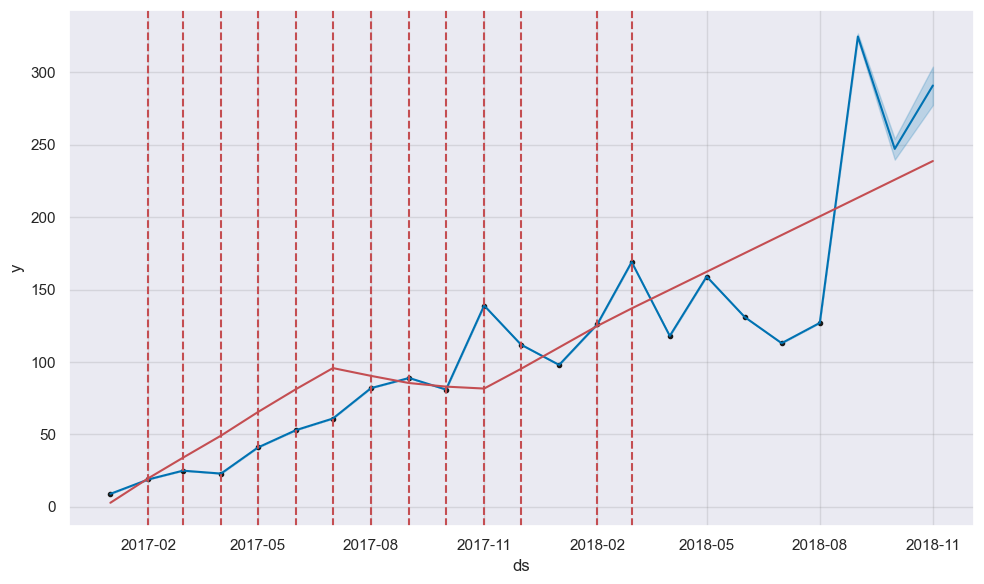

In [90]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True)
forecast = pro_change.fit(df_heaD).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### print do forecast

In [91]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-01,2.83,9.00,9.00,2.83,2.83,6.17,6.17,6.17,6.17,6.17,6.17,0.00,0.00,0.00,9.00
1,2017-02-01,19.81,19.00,19.00,19.81,19.81,-0.81,-0.81,-0.81,-0.81,-0.81,-0.81,0.00,0.00,0.00,19.00
2,2017-03-01,33.93,25.00,25.00,33.93,33.93,-8.92,-8.92,-8.92,-8.92,-8.92,-8.92,0.00,0.00,0.00,25.00
3,2017-04-01,49.20,23.00,23.00,49.20,49.20,-26.20,-26.20,-26.20,-26.20,-26.20,-26.20,0.00,0.00,0.00,23.00
4,2017-05-01,65.45,41.00,41.00,65.45,65.45,-24.45,-24.45,-24.45,-24.45,-24.45,-24.45,0.00,0.00,0.00,41.00
5,2017-06-01,81.28,53.00,53.00,81.28,81.28,-28.28,-28.28,-28.28,-28.28,-28.28,-28.28,0.00,0.00,0.00,53.00
6,2017-07-01,95.81,61.00,61.00,95.81,95.81,-34.81,-34.81,-34.81,-34.81,-34.81,-34.81,0.00,0.00,0.00,61.00
7,2017-08-01,90.43,82.00,82.00,90.43,90.43,-8.43,-8.43,-8.43,-8.43,-8.43,-8.43,0.00,0.00,0.00,82.00
8,2017-09-01,85.48,89.00,89.00,85.48,85.48,3.52,3.52,3.52,3.52,3.52,3.52,0.00,0.00,0.00,89.00
9,2017-10-01,83.01,81.00,81.00,83.01,83.01,-2.02,-2.02,-2.02,-2.02,-2.02,-2.02,0.00,0.00,0.00,81.00


### acrescentando o parâmetro "changepoint_prior_scale"

13:10:22 - cmdstanpy - INFO - Chain [1] start processing
13:10:32 - cmdstanpy - INFO - Chain [1] done processing


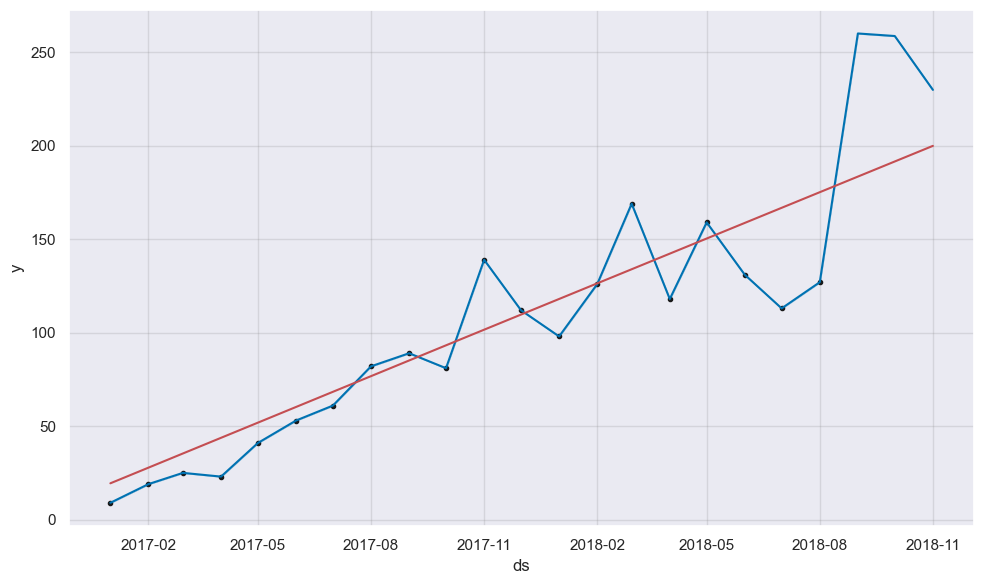

In [92]:
pro_change= Prophet(n_changepoints=10, yearly_seasonality=True, changepoint_prior_scale=0.05)
forecast = pro_change.fit(df_heaD).predict(future_dates)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

### print do forecast

In [93]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-01,19.42,9.00,9.00,19.42,19.42,-10.42,-10.42,-10.42,-10.42,-10.42,-10.42,0.00,0.00,0.00,9.00
1,2017-02-01,27.80,19.00,19.00,27.80,27.80,-8.80,-8.80,-8.80,-8.80,-8.80,-8.80,0.00,0.00,0.00,19.00
2,2017-03-01,35.37,25.00,25.00,35.37,35.37,-10.37,-10.37,-10.37,-10.37,-10.37,-10.37,0.00,0.00,0.00,25.00
3,2017-04-01,43.76,23.00,23.00,43.76,43.76,-20.76,-20.76,-20.76,-20.76,-20.76,-20.76,0.00,0.00,0.00,23.00
4,2017-05-01,51.87,41.00,41.00,51.87,51.87,-10.87,-10.87,-10.87,-10.87,-10.87,-10.87,0.00,0.00,0.00,41.00
5,2017-06-01,60.25,53.00,53.00,60.25,60.25,-7.25,-7.25,-7.25,-7.25,-7.25,-7.25,0.00,0.00,0.00,53.00
6,2017-07-01,68.37,61.00,61.00,68.37,68.37,-7.37,-7.37,-7.37,-7.37,-7.37,-7.37,0.00,0.00,0.00,61.00
7,2017-08-01,76.75,82.00,82.00,76.75,76.75,5.25,5.25,5.25,5.25,5.25,5.25,0.00,0.00,0.00,82.00
8,2017-09-01,85.13,89.00,89.00,85.13,85.13,3.87,3.87,3.87,3.87,3.87,3.87,0.00,0.00,0.00,89.00
9,2017-10-01,93.23,81.00,81.00,93.23,93.23,-12.23,-12.23,-12.23,-12.23,-12.23,-12.23,0.00,0.00,0.00,81.00


# Questão 5

# Modelo preditivo de preços

In [94]:
df.head()

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,01-05-2017,1,45.95,15.10,45.95,39,161,2,350,4.00,57,23,8,1,5,2017,10.27,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,01-06-2017,3,137.85,12.93,45.95,39,161,2,350,4.00,61,22,8,1,6,2017,6.50,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,01-07-2017,6,275.70,14.84,45.95,39,161,2,350,4.00,123,21,10,1,7,2017,12.07,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,01-08-2017,4,183.80,14.29,45.95,39,161,2,350,4.00,90,23,8,1,8,2017,9.29,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,01-09-2017,2,91.90,15.10,45.95,39,161,2,350,4.00,54,21,9,1,9,2017,5.56,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95


### criando df para a categoria "watches_gifts"

In [95]:
df_wat1 = df[df['product_category_name']=='watches_gifts']
df_wat1.head()

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
212,watches2,watches_gifts,01-06-2017,5,789.95,13.91,157.99,35,591,3,444,4.00,17,22,8,1,6,2017,4.07,4480,163.00,4.20,14.27,157.99,4.00,13.91,185.00,3.80,14.74,157.94
213,watches2,watches_gifts,01-07-2017,6,1016.95,14.95,171.79,35,591,3,444,4.00,29,21,10,1,7,2017,7.53,4480,161.59,4.20,15.53,171.79,4.00,14.95,197.38,3.80,16.61,157.99
214,watches2,watches_gifts,01-08-2017,5,849.50,17.08,169.90,35,591,3,444,4.00,48,23,8,1,8,2017,5.46,4480,160.67,4.20,15.19,169.90,4.00,17.08,179.90,3.80,14.93,171.79
215,watches2,watches_gifts,01-09-2017,10,1604.00,17.86,160.40,35,591,3,444,4.00,54,21,9,1,9,2017,13.51,4480,148.78,4.20,14.04,160.40,4.00,17.86,164.57,3.80,19.53,169.90
216,watches2,watches_gifts,01-10-2017,16,2391.60,18.51,149.47,35,591,3,444,4.00,43,22,9,2,10,2017,21.62,4480,134.90,4.20,6.81,149.47,4.00,18.51,232.49,3.80,14.21,160.40


In [96]:
df_wat1.product_id.unique()

array(['watches2', 'watches6', 'watches8', 'watches5', 'watches4',
       'watches3', 'watches7', 'watches1'], dtype=object)

In [97]:
df_wat1.drop(['month_year','product_name_lenght','product_description_lenght',
             'product_photos_qty','product_weight_g','s'], axis=1, inplace=True)
df_wat1.head()

,product_id,product_category_name,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
212,watches2,watches_gifts,5,789.95,13.91,157.99,4.00,17,22,8,1,6,2017,4480,163.00,4.20,14.27,157.99,4.00,13.91,185.00,3.80,14.74,157.94
213,watches2,watches_gifts,6,1016.95,14.95,171.79,4.00,29,21,10,1,7,2017,4480,161.59,4.20,15.53,171.79,4.00,14.95,197.38,3.80,16.61,157.99
214,watches2,watches_gifts,5,849.50,17.08,169.90,4.00,48,23,8,1,8,2017,4480,160.67,4.20,15.19,169.90,4.00,17.08,179.90,3.80,14.93,171.79
215,watches2,watches_gifts,10,1604.00,17.86,160.40,4.00,54,21,9,1,9,2017,4480,148.78,4.20,14.04,160.40,4.00,17.86,164.57,3.80,19.53,169.90
216,watches2,watches_gifts,16,2391.60,18.51,149.47,4.00,43,22,9,2,10,2017,4480,134.90,4.20,6.81,149.47,4.00,18.51,232.49,3.80,14.21,160.40


### criando df para o produto "watches1"

In [98]:
df_wat2 = df_wat1[df_wat1['product_id']=='watches1']
df_wat2.head(20)

,product_id,product_category_name,qty,total_price,freight_price,unit_price,product_score,customers,weekday,weekend,holiday,month,year,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
634,watches1,watches_gifts,5,1205.03,21.32,241.01,3.80,6,23,8,1,3,2017,2856,241.01,3.80,21.32,241.01,3.80,21.32,241.01,3.80,21.32,240.96
635,watches1,watches_gifts,3,766.83,21.23,255.61,3.80,3,20,10,2,4,2017,2856,255.61,3.80,21.23,255.61,3.80,21.23,255.61,3.80,21.23,241.01
636,watches1,watches_gifts,5,925.00,14.74,185.00,3.80,17,22,8,1,6,2017,2856,163.00,4.20,14.27,185.00,3.80,14.74,185.00,3.80,14.74,184.95
637,watches1,watches_gifts,10,1973.83,16.61,197.38,3.80,29,21,10,1,7,2017,2856,161.59,4.20,15.53,197.38,3.80,16.61,197.38,3.80,16.61,185.00
638,watches1,watches_gifts,15,2698.50,14.93,179.90,3.80,48,23,8,1,8,2017,2856,160.67,4.20,15.19,179.90,3.80,14.93,179.90,3.80,14.93,197.38
639,watches1,watches_gifts,20,3291.40,19.53,164.57,3.80,54,21,9,1,9,2017,2856,148.78,4.20,14.04,164.57,3.80,19.53,164.57,3.80,19.53,179.90
640,watches1,watches_gifts,4,929.96,14.21,232.49,3.80,43,22,9,2,10,2017,2856,134.90,4.20,6.81,232.49,3.80,14.21,232.49,3.80,14.21,164.57
641,watches1,watches_gifts,18,3139.80,20.99,174.43,3.80,91,22,8,4,11,2017,2856,133.00,4.20,19.92,108.00,4.20,15.91,174.43,3.80,20.99,232.49
642,watches1,watches_gifts,5,929.80,18.69,185.96,3.80,73,21,10,1,12,2017,2856,149.00,4.20,19.10,108.00,4.20,16.65,185.96,3.80,18.69,174.43
643,watches1,watches_gifts,2,398.00,21.88,199.00,3.80,59,23,8,2,1,2018,2856,199.00,3.80,21.88,108.00,4.20,16.20,199.00,3.80,21.88,185.96


### criando df com data (mes/ano) vs preço

In [99]:
df_wat3 = df_wat1.groupby(['product_id','year','month']).agg({'unit_price':pd.Series.mean})
df_wat3 = df_wat3.reset_index()
df_wat3['data'] = pd.to_datetime(df_wat3.year.astype(str) + '/' + df_wat3.month.astype(str))
df_wat3

,product_id,year,month,unit_price,data
0,watches1,2017,3,241.01,2017-03-01
1,watches1,2017,4,255.61,2017-04-01
2,watches1,2017,6,185.00,2017-06-01
3,watches1,2017,7,197.38,2017-07-01
4,watches1,2017,8,179.90,2017-08-01
5,watches1,2017,9,164.57,2017-09-01
6,watches1,2017,10,232.49,2017-10-01
7,watches1,2017,11,174.43,2017-11-01
8,watches1,2017,12,185.96,2017-12-01
9,watches1,2018,1,199.00,2018-01-01


In [100]:
df_rel1 = df_wat3[df_wat3['product_id']=='watches1']
df_rel1 = df_rel1[['data','unit_price']]

### convertendo datetime dtype para numérico para aplicar o modelo de regressão

In [101]:
df_rel1['conv_date'] = pd.to_datetime(df_rel1.data, format="%Y-%M-%D")
df_rel1['conv_date'] = df_rel1['conv_date'].map(dt.datetime.toordinal)
df_rel1.head()

,data,unit_price,conv_date
0,2017-03-01,241.01,736389
1,2017-04-01,255.61,736420
2,2017-06-01,185.00,736481
3,2017-07-01,197.38,736511
4,2017-08-01,179.90,736542


In [102]:
df_rel1.dtypes

data          datetime64[ns]
unit_price           float64
conv_date              int64
dtype: object

In [103]:
df_rel1 = df_rel1[['conv_date','unit_price']]
df_rel1.head()

,conv_date,unit_price
0,736389,241.01
1,736420,255.61
2,736481,185.00
3,736511,197.38
4,736542,179.90


### plot da dependência do preço vs data

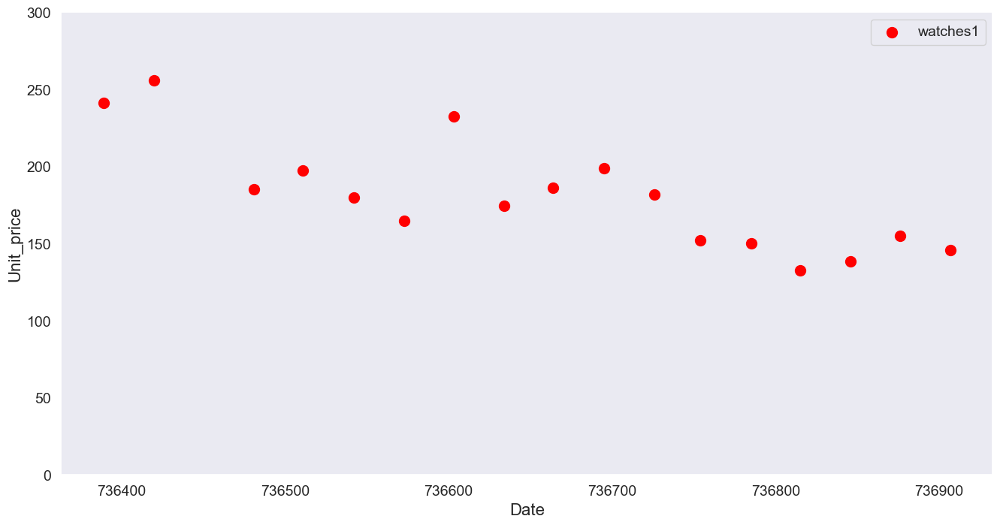

In [104]:
fig, ax = plt.subplots(figsize=(16, 8))
ax.scatter(df_rel1['conv_date'],df_rel1['unit_price'], marker="o", color="red", s=100)#, label='watches1')

# Format x-axis labels as dates
plt.xlabel('Date', fontsize=16)
plt.ylabel('Unit_price', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(labels=['watches1'], fontsize=14)
ax.set_ylim([0, 300])
plt.show()

### Splitting variables

In [105]:
X = df_rel1.iloc[:, :1]  # independent
y = df_rel1.iloc[:, 1:]  # dependent

### Splitting dataset into test/train

In [106]:
from sklearn.model_selection import train_test_split
from pandas.core.common import random_state
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

### definindo o modelo de regressão e fazendo o fit

In [107]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

### Prediction result

In [108]:
y_pred_test = regressor.predict(X_test)     # predicted value of y_test
y_pred_train = regressor.predict(X_train)   # predicted value of y_train

### Prediction on training set

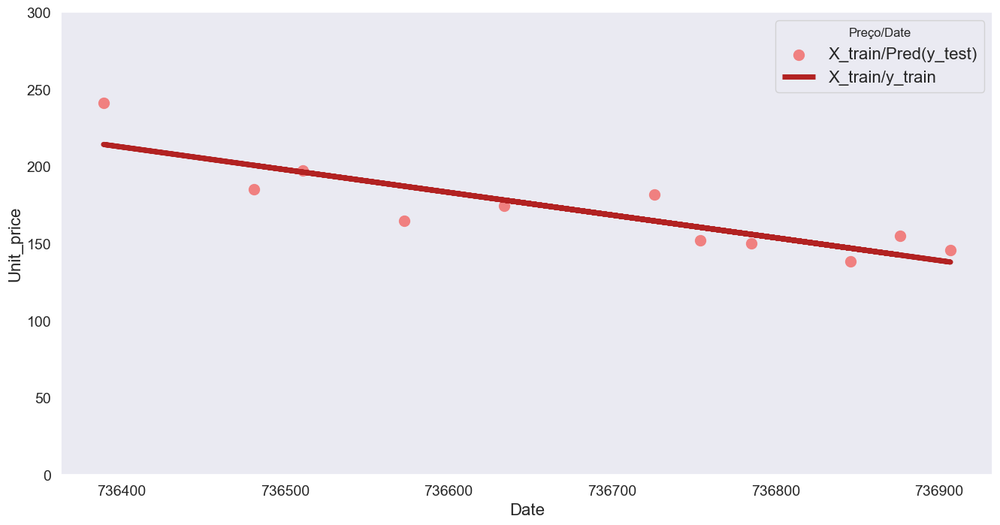

In [109]:
fig, ax = plt.subplots(figsize=(16, 8))
ax.scatter(X_train, y_train, color = 'lightcoral', marker="o", s=100)
ax.plot(X_train, y_pred_train, color = 'firebrick', linewidth=5., solid_capstyle='butt')
plt.xlabel('Date', fontsize=16)
plt.ylabel('Unit_price', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(['X_train/Pred(y_test)', 'X_train/y_train'], title = 'Preço/Date', loc='best', fontsize=16)
ax.set_ylim([0, 300])
plt.show()

### Prediction on test set

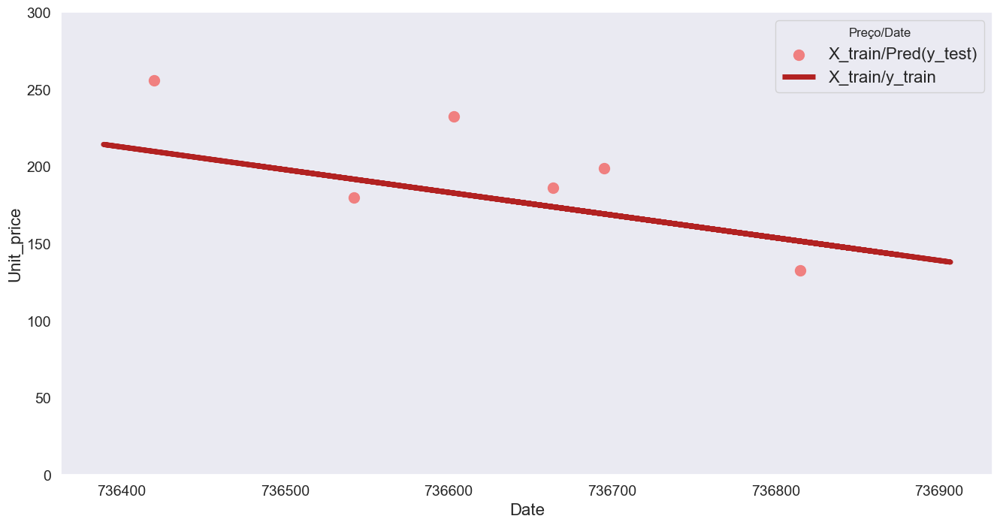

In [110]:
fig, ax = plt.subplots(figsize=(16, 8))
ax.scatter(X_test, y_test, color = 'lightcoral', marker="o", s=100)
ax.plot(X_train, y_pred_train, color = 'firebrick', linewidth=5., solid_capstyle='butt')
plt.xlabel('Date', fontsize=16)
plt.ylabel('Unit_price', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(['X_train/Pred(y_test)', 'X_train/y_train'], title = 'Preço/Date', loc='best', fontsize=16)
ax.set_ylim([0, 300])
plt.show()

### Regressor coefficients and intercept - necessários para a predição de preços

In [111]:
print(f'Coefficient: {regressor.coef_}')
print(f'Intercept: {regressor.intercept_}')

Coefficient: [[-0.1472324]]
Intercept: [108634.56876251]


# Questão 6

In [112]:
df_otim = df.copy()
df_otim.head()

,product_id,product_category_name,month_year,qty,total_price,freight_price,unit_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_score,customers,weekday,weekend,holiday,month,year,s,volume,comp_1,ps1,fp1,comp_2,ps2,fp2,comp_3,ps3,fp3,lag_price
0,bed1,bed_bath_table,01-05-2017,1,45.95,15.10,45.95,39,161,2,350,4.00,57,23,8,1,5,2017,10.27,3800,89.90,3.90,15.01,215.00,4.40,8.76,45.95,4.00,15.10,45.90
1,bed1,bed_bath_table,01-06-2017,3,137.85,12.93,45.95,39,161,2,350,4.00,61,22,8,1,6,2017,6.50,3800,89.90,3.90,14.77,209.00,4.40,21.32,45.95,4.00,12.93,45.95
2,bed1,bed_bath_table,01-07-2017,6,275.70,14.84,45.95,39,161,2,350,4.00,123,21,10,1,7,2017,12.07,3800,89.90,3.90,13.99,205.00,4.40,22.20,45.95,4.00,14.84,45.95
3,bed1,bed_bath_table,01-08-2017,4,183.80,14.29,45.95,39,161,2,350,4.00,90,23,8,1,8,2017,9.29,3800,89.90,3.90,14.66,199.51,4.40,19.41,45.95,4.00,14.29,45.95
4,bed1,bed_bath_table,01-09-2017,2,91.90,15.10,45.95,39,161,2,350,4.00,54,21,9,1,9,2017,5.56,3800,89.90,3.90,18.78,163.40,4.40,24.32,45.95,4.00,15.10,45.95


### Padronizando as variáveis numéricas

In [113]:
from sklearn.preprocessing import StandardScaler

features = ['unit_price', 'freight_price', 'product_photos_qty', 'product_score', 'comp_1', 'comp_2', 'comp_3']
target_variable = 'qty'

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_otim[features], 
                                                    df_otim[target_variable], 
                                                    test_size=0.2, random_state=42)

# Standardise numerical features
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### definindo o modelo de regressão

In [114]:
model = LinearRegression()

### fitando o dataset de treino

In [115]:
model.fit(X_train_scaled, y_train)

# Predict sales quantity for the test set
y_pred = model.predict(X_test_scaled)

### Evaluate the model on the test set

In [116]:
y_pred = model.predict(X_test_scaled)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Test RMSE: {test_rmse:.2f}")

# Make predictions on the entire dataset
df_otim["predicted_sales"] = model.predict(scaler.transform(df_otim[features]))

Test RMSE: 16.90


### criando variáveis adicionais para o ajuste do preço

In [117]:
mean_sales = df_otim["predicted_sales"].mean()
std_sales = df_otim["predicted_sales"].std()
scaling_factor = 1 +  (0.1 * (df_otim["predicted_sales"] - mean_sales) / std_sales)
df_otim['scf'] = scaling_factor.astype(float)

# Calculate adjusted price based on the above variables
df_otim['adj_psc'] = df_otim['unit_price'] * df_otim['scf']

df_otim["apbm"] = df_otim["unit_price"] * (1 + 0.1)
df_otim['min_price'] = df_otim['unit_price']*0.9
df_otim['mean_conc'] = (df_otim["comp_1"]+df_otim["comp_2"]+df_otim["comp_3"])/3
df_otim['adj_price'] = np.maximum(np.maximum(df_otim['min_price'], df_otim['adj_psc']), df_otim['apbm'])

### Display the DataFrame with adjusted prices for a sample of 30 rows

In [118]:
print(df_otim[['unit_price','scf','min_price',\
               'adj_psc','apbm','adj_price','mean_conc']].sample(n=30))

     unit_price  scf  min_price  adj_psc   apbm  adj_price  mean_conc
305      129.99 0.94     116.99   122.64 142.99     142.99     119.99
545      330.00 1.15     297.00   380.36 363.00     380.36     156.33
365      145.17 0.93     130.65   134.37 159.68     159.68     113.77
665       45.90 1.23      41.31    56.33  50.49      56.33      57.60
107       99.99 0.99      89.99    99.40 109.99     109.99     109.99
327       66.34 1.02      59.71    67.62  72.98      72.98     115.93
310      129.99 1.01     116.99   131.87 142.99     142.99      86.49
44        59.90 1.03      53.91    62.00  65.89      65.89      59.90
391       64.99 1.03      58.49    67.03  71.49      71.49      58.32
65        23.99 1.02      21.59    24.54  26.39      26.39      57.66
641      174.43 0.92     156.99   159.76 191.88     191.88     138.48
217      140.56 1.00     126.50   140.18 154.62     154.62     138.48
517       51.23 0.98      46.11    50.14  56.36      56.36      50.60
186       66.99 0.93

### comparação do preço otimizado com os preços médios dos concorrentes 
### para todas as categorias e produtos 

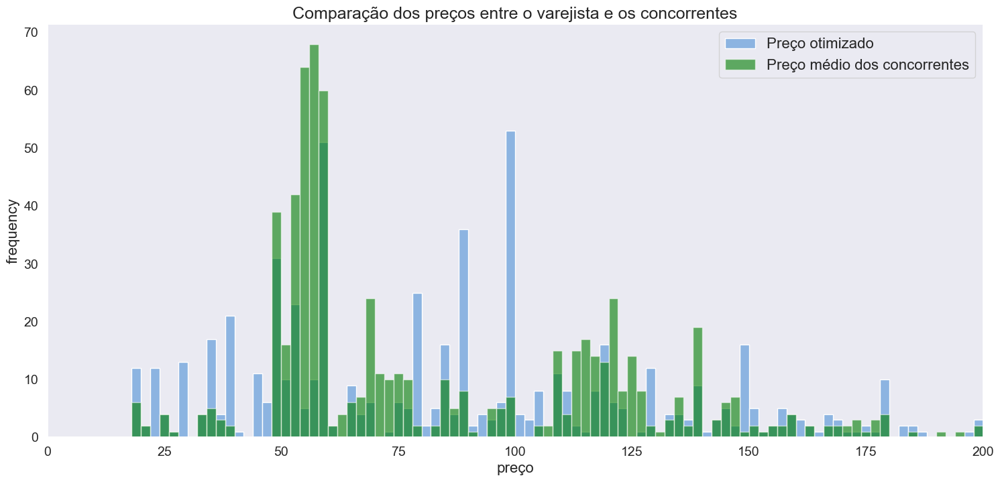

In [119]:
fig, ax = plt.subplots(figsize=(18,8))
ax.hist(df_otim['unit_price'], color='#8CB4E1', alpha=1.0, bins=100, range = [0, 200],
       label='Preço otimizado')
ax.hist(df_otim['mean_conc'], color='#007D00', alpha=0.6, bins=100, range = [0, 200],
       label='Preço médio dos concorrentes')
plt.xlabel('preço', fontsize=16)
plt.ylabel('frequency', fontsize=16)
plt.title('Comparação dos preços entre o varejista e os concorrentes', fontsize=18)
plt.tick_params(labelsize=14)
ax.set_xlim([0, 200])
plt.legend(fontsize=16)
plt.show()

### comparação do preço otimizado com os preços médios dos concorrentes para 4 categorias:
#### bed_bath_table
#### furniture_decor
#### health_beauty
#### watches_gifts

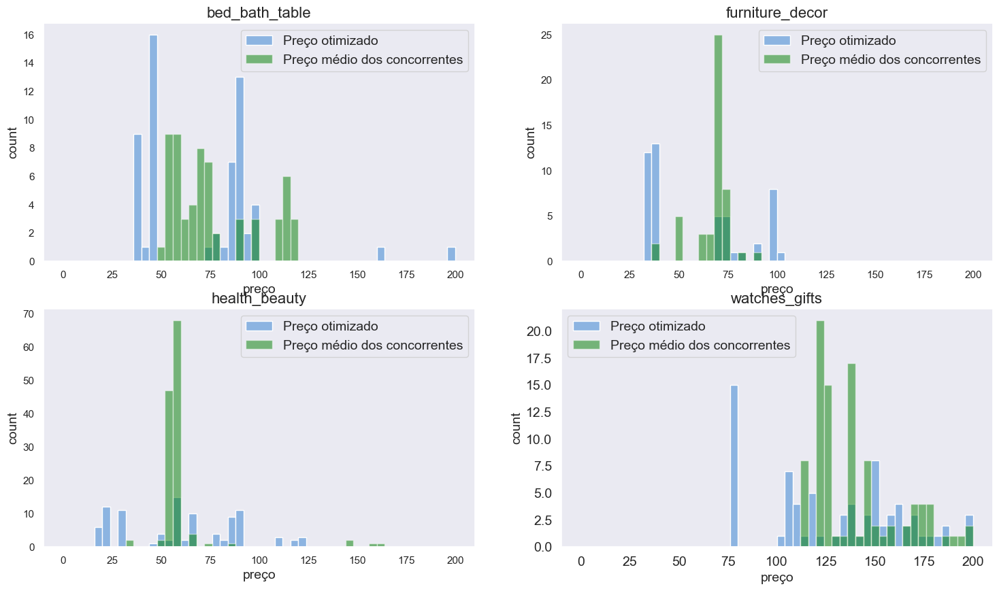

In [120]:
df_cat1 = df_otim[df_otim['product_category_name']=='bed_bath_table']
df_cat2 = df_otim[df_otim['product_category_name']=='furniture_decor']
df_cat3 = df_otim[df_otim['product_category_name']=='health_beauty']
df_cat4 = df_otim[df_otim['product_category_name']=='watches_gifts']

fig, axs = plt.subplots(2,2,figsize=(18,10))
axs[0,0].hist(df_cat1['unit_price'], color='#8CB4E1', alpha=1.0, bins=50, range = [0, 200],
       label='Preço otimizado')
axs[0,0].hist(df_cat1['mean_conc'], color='#007D00', alpha=0.5, bins=50, range = [0, 200],
       label='Preço médio dos concorrentes')

axs[0,1].hist(df_cat2['unit_price'], color='#8CB4E1', alpha=1.0, bins=50, range = [0, 200],
       label='Preço otimizado')
axs[0,1].hist(df_cat2['mean_conc'], color='#007D00', alpha=0.5, bins=50, range = [0, 200],
       label='Preço médio dos concorrentes')

axs[1,0].hist(df_cat3['unit_price'], color='#8CB4E1', alpha=1.0, bins=50, range = [0, 200],
       label='Preço otimizado')
axs[1,0].hist(df_cat3['mean_conc'], color='#007D00', alpha=0.5, bins=50, range = [0, 200],
       label='Preço médio dos concorrentes')

axs[1,1].hist(df_cat4['unit_price'], color='#8CB4E1', alpha=1.0, bins=50, range = [0, 200],
       label='Preço otimizado')
axs[1,1].hist(df_cat4['mean_conc'], color='#007D00', alpha=0.5, bins=50, range = [0, 200],
       label='Preço médio dos concorrentes')

plt.xlabel('preço', fontsize=14)
plt.ylabel('frequency', fontsize=14)
plt.tick_params(labelsize=14)
axs[0,0].set_title('bed_bath_table', fontsize=16)
axs[0,0].set_xlabel('preço', fontsize=14)
axs[0,0].set_ylabel('count', fontsize=14)
axs[0,0].legend(loc='upper right', fontsize=14)
axs[0,1].set_title('furniture_decor', fontsize=16)
axs[0,1].set_xlabel('preço', fontsize=14)
axs[0,1].set_ylabel('count', fontsize=14)
axs[0,1].legend(loc='upper right', fontsize=14)
axs[1,0].set_title('health_beauty', fontsize=16)
axs[1,0].set_xlabel('preço', fontsize=14)
axs[1,0].set_ylabel('count', fontsize=14)
axs[1,0].legend(loc='upper right', fontsize=14)
axs[1,1].set_title('watches_gifts', fontsize=16)
axs[1,1].set_xlabel('preço', fontsize=14)
axs[1,1].set_ylabel('count', fontsize=14)
axs[1,1].legend(loc='upper left', fontsize=14)
plt.show()

# Questão 7

- Demanda histórica: O histórico de vendas é muito limitado. É necessário um período mais longo e mais detalhado – diário ou pelo menos, semanal

- Custo de produção/aquisição: Conhecer os custos associados à produção ou aquisição dos produtos é importante para garantir que os preços estabelecidos sejam lucrativos.

- Elasticidade de preço:  A elasticidade de preço da demanda indica como a quantidade demandada de um produto muda em resposta a mudanças no preço. Essa informação é muito útil para ajustar os preços de forma ótima.

- Segmentação de clientes: Diferentes segmentos de clientes podem ter sensibilidades de preço distintas. A personalização dos preços com base no comportamento do cliente pode ser vantajoso.

- Feedback dos clientes: Além da nota de avaliação, comentários dos clientes, pesquisas de satisfação e outras formas de feedback podem ser úteis

- Estratégias de desconto e promoção: Estudar o impacto de descontos e promoções na demanda e no lucro pode fornecer informações  a determinar a eficácia dessas estratégias e otimizar sua utilização

# Questão 8

Independente do ambiente utilizado (GCP, AWS, AZURE, etc) o pipeline de dados deve ter a seguinte estrutura:

- Aquisição de dados -
Identificar as fontes de dados relevantes, como registros de vendas, dados de inventário, dados de preços, dados meteorológicos, dados econômicos, entre outros.

- Limpeza e pré-processamento de dados -
Remover dados duplicados, ausentes ou inconsistentes. -
Transformar os dados em um formato adequado para análise, como séries temporais para dados de vendas e preços.

- Engenharia de variáveis (feature engineering) -
Criar (se necessário) novas variáveis a partir dos dados existentes que possam ser relevantes para os modelos, como médias móveis, sazonalidade, indicadores de eventos especiais, entre outros. -
Criar variáveis de lag (atraso), que representam valores anteriores de vendas e preços, pois podem ser úteis em modelos de previsão temporal.

- Divisão de dados -
Separar os dados em conjuntos de treinamento, validação e teste

- Modelagem -
Escolher os algoritmos de Machine Learning mais adequados para o problema, como modelos de séries temporais, modelos lineares, árvores de decisão, redes neurais, entre outros. -
Treinar vários modelos com diferentes hiperparâmetros e técnicas de regularização para encontrar o melhor desempenho

- Avaliação do modelo -
Avaliar o desempenho dos modelos usando métricas adequadas escolhidas em conjunto com o time de negócio -
Comparar o desempenho dos diferentes modelos e selecionar o melhor modelo com base nas métricas de avaliação

- Deploy e monitoramento -
Fazer o deploy do modelo em um ambiente de produção, onde possa ser usado para fazer previsões em tempo real -
Monitorar regularmente o desempenho do modelo (retreinar se necessário)

- Iteração e melhoria contínua -
Analisar constantemente os resultados e sempre buscar maneiras de melhorar o pipeline de dados, os modelos e as estratégias de previsão com base no feedback do time de negócios

# Questão 9

- Monitorar a qualidade dos dados de entrada, como a presença de valores ausentes, duplicados ou inconsistentes.
- Verificar se as fontes de dados estão enviando dados conforme o esperado e se não houve interrupções na coleta de dados
- Monitorar se não houve mudanças nas características dos dados que possam afetar a eficácia dos modelos
- Monitorar o processo de treinamento do modelo para detectar possíveis problemas, como instabilidades durante o treinamento, tempos de treinamento anormalmente longos ou falhas no processo de treinamento
- Verificar se os hiperparâmetros estão sendo ajustados corretamente e se não houve alterações significativas nos resultados de treinamento ao longo do tempo
- Acompanhar regularmente as métricas de desempenho do modelo nos conjuntos de validação e teste
- Identificar variações significativas nas métricas de avaliação que possam indicar deterioração do desempenho do modelo
- Detectar qualquer degradação do desempenho do modelo em tempo real e implementar alertas para notificar sobre problemas.
- Coletar feedback dos usuários sobre as previsões do modelo e monitorar a satisfação do usuário.
- Realizar validação contínua do modelo com novos dados para garantir que continue a produzir previsões precisas ao longo do tempo.